In [1]:
import yfinance as yf
symbol = 'AKBNK.IS'
df = yf.download(symbol, period='6y', intervals='1d')
df.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2016-11-11,6.790967,6.825265,6.628053,6.636627,5.854577,26498904
2016-11-14,6.662350,6.696648,6.610904,6.628053,5.847013,20974050
2016-11-15,6.662350,6.773818,6.662350,6.765244,5.968038,24600011
2016-11-16,6.790967,6.799542,6.628053,6.670925,5.884833,24711955
2016-11-17,6.705223,6.765244,6.653776,6.670925,5.884833,22566806


In [2]:
df.reset_index(inplace=True)

In [3]:
df.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
1530,2022-11-07,14.77,15.32,14.76,15.24,15.24,192680049
1531,2022-11-08,15.29,15.59,14.98,15.21,15.21,201986838
1532,2022-11-09,15.24,15.38,14.86,14.94,14.94,154904351
1533,2022-11-10,14.95,15.53,14.94,15.43,15.43,188682288
1534,2022-11-11,15.80,15.89,14.89,14.98,14.98,149972527


In [4]:
import chart_studio.plotly as py
import math
import matplotlib
import numpy as np
import os
import pandas as pd
import pickle
import pylab
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objs as go
import plotly.offline as pyo
import scipy.stats as stats
import time

from collections import defaultdict
from datetime import date
from lightgbm import LGBMRegressor
from matplotlib import pyplot as plt
from plotly.subplots import make_subplots
from pylab import rcParams
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from tqdm import tqdm_notebook
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action = 'ignore', category = pd.errors.PerformanceWarning)

%matplotlib inline

pyo.init_notebook_mode()

# py.sign_in(, ) # sign in to plotly if you haven't done so

#### Input params ##################
folder = "./data/"
filename = "VTI_20130102_20181231.csv"

# Predicting on day 1008, date 2020-11-11 00:00:00   ########
# Predicting on day 1050, date 2017-03-06 00:00:00
# Predicting on day 1092, date 2017-05-04 00:00:00
# Predicting on day 1134, date 2017-07-05 00:00:00
# Predicting on day 1176, date 2017-09-01 00:00:00
# Predicting on day 1218, date 2017-11-01 00:00:00
# Predicting on day 1260, date 2018-01-03 00:00:00
# Predicting on day 1302, date 2018-03-06 00:00:00
# Predicting on day 1344, date 2018-05-04 00:00:00
# Predicting on day 1386, date 2018-07-05 00:00:00
# Predicting on day 1428, date 2018-09-04 00:00:00
# Predicting on day 1470, date 2018-11-01 00:00:00

pred_date = '2020-11-11'        # Predict for this day, for the next H-1 days. Note indexing of days start from 0.

H = 21                         # Forecast horizon, in days. Note there are about 252 trading days in a year
train_size = 252*3             # Use 3 years of data as train set. Note there are about 252 trading days in a year
val_size = 252                 # Use 1 year of data as validation set
N = 10                         # for feature at day t, we use lags from t-1, t-2, ..., t-N as features

# Params for lightgbm
boosting_type = 'gbdt'
learning_rate = 0.1
max_depth = -1
n_estimators = 100 

# Params for ExtraTreesRegressor
n_estimators_etr = 100         # The number of trees in the forest. default = 100
max_depth_etr = None           # The maximum depth of the tree. default = None
max_features_etr = 'auto'      # The number of features to consider when looking for the best split. default = 'auto'
min_samples_split_etr = 2      # The minimum number of samples required to split an internal node. default = 2

# Params for SVR
kernel = 'rbf'                 # Specifies the kernel type to be used in the algorithm. default = 'rbf'
C = 1.0                        # Regularization parameter. The strength of the regularization is inversely proportional to C. default = 1.0
gamma_svr = 0.1                # Kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’. default = 'scale'

model_seed = 100

fontsize = 14
ticklabelsize = 14

# Plotly colors
colors = [
    '#1f77b4',  # muted blue
    '#ff7f0e',  # safety orange
    '#2ca02c',  # cooked asparagus green
    '#d62728',  # brick red
    '#9467bd',  # muted purple
    '#8c564b',  # chestnut brown
    '#e377c2',  # raspberry yogurt pink
    '#7f7f7f',  # middle gray
    '#bcbd22',  # curry yellow-green
    '#17becf'   # blue-teal
]

####################################

train_val_size = train_size + val_size # Size of train+validation set
print("No. of days in train+validation set = " + str(train_val_size))

No. of days in train+validation set = 1008


In [5]:
tic1 = time.time()

In [6]:
def get_mape(y_true, y_pred): 
    """
    Compute mean absolute percentage error (MAPE)
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def get_wape(y_true, y_pred): 
    """
    Compute weighted absolute percentage error (WAPE)
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return sum(np.abs(y_true - y_pred)) / sum(y_true) * 100

def get_mae(a, b):
    """
    Comp mean absolute error e_t = E[|a_t - b_t|]. a and b can be lists.
    Returns a vector of len = len(a) = len(b)
    """
    return np.mean(abs(np.array(a)-np.array(b)))

def get_rmse(a, b):
    """
    Comp RMSE. a and b can be lists.
    Returns a scalar.
    """
    return math.sqrt(np.mean((np.array(a)-np.array(b))**2))

In [7]:
def get_mov_avg_std(df, col, N):
    """
    Given a dataframe, get mean and std dev at timestep t using values from t-1, t-2, ..., t-N.
    Inputs
        df         : dataframe. Can be of any length.
        col        : name of the column you want to calculate mean and std dev
        N          : get mean and std dev at timestep t using values from t-1, t-2, ..., t-N
    Outputs
        df_out     : same as df but with additional column containing mean and std dev
    """
    mean_list = df[col].rolling(window = N, min_periods=1).mean() # len(mean_list) = len(df)
    std_list = df[col].rolling(window = N, min_periods=1).std()   # first value will be NaN, because normalized by N-1
    
    # Add one timestep to the predictions
    mean_list = np.concatenate((np.array([np.nan]), np.array(mean_list[:-1])))
    std_list = np.concatenate((np.array([np.nan]), np.array(std_list[:-1])))
    
    # Append mean_list to df
    df_out = df.copy()
    df_out[col + '_mean'] = mean_list
    df_out[col + '_std'] = std_list
    
    return df_out



def add_lags(df, N, lag_cols):
    """
    Add lags up to N number of days to use as features
    The lag columns are labelled as 'adj_close_lag_1', 'adj_close_lag_2', ... etc.
    """
    # Use lags up to N number of days to use as features
    df_w_lags = df.copy()
    df_w_lags.loc[:, 'order_day'] = [x for x in list(range(len(df)))] # Add a column 'order_day' to indicate the order of the rows by date
    merging_keys = ['order_day'] # merging_keys
    shift_range = [x+1 for x in range(N)]
    for shift in shift_range:
        train_shift = df_w_lags[merging_keys + lag_cols].copy()
    
        # E.g. order_day of 0 becomes 1, for shift = 1.
        # So when this is merged with order_day of 1 in df_w_lags, this will represent lag of 1.
        train_shift['order_day'] = train_shift['order_day'] + shift
    
        foo = lambda x: '{}_lag_{}'.format(x, shift) if x in lag_cols else x
        train_shift = train_shift.rename(columns=foo)

        df_w_lags = pd.merge(df_w_lags, train_shift, on=merging_keys, how='left') #.fillna(0)
    del train_shift
    
    return df_w_lags


def add_leads(df, N, lead_cols):
    """
    Add leads up to N number of days to use as targets
    The lead columns are labelled as 'adj_close_lead_1', 'adj_close_lead_2', ... etc.
    """
    # Add leads up to N number of days to use as targets
    df_w_leads = df.copy()
    df_w_leads.loc[:, 'order_day'] = [x for x in list(range(len(df)))] # Add a column 'order_day' to indicate the order of the rows by date
    merging_keys = ['order_day'] # merging_keys
    shift_range = [x+1 for x in range(N)]
    for shift in shift_range:
        train_shift = df_w_leads[merging_keys + lead_cols].copy()
    
        # E.g. order_day of N becomes N-1, for shift = 1.
        # So when this is merged with order_day of N-1 in df_w_leads, this will represent lead of 1.
        train_shift['order_day'] = train_shift['order_day'] - shift
    
        foo = lambda x: '{}_lead_{}'.format(x, shift) if x in lead_cols else x
        train_shift = train_shift.rename(columns=foo)

        df_w_leads = pd.merge(df_w_leads, train_shift, on=merging_keys, how='left') #.fillna(0)
    del train_shift
    
    return df_w_leads

In [8]:
def get_sma(X, df):
    """
    Get features related to simple moving average
    Inputs
        X  : dataframe without the SMA features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional SMA features
    """
    
    # Simple moving average
    df['sma_10'] = df['adj_close'].rolling(window = 10).mean()
    df['sma_20'] = df['adj_close'].rolling(window = 20).mean()
    df['sma_50'] = df['adj_close'].rolling(window = 50).mean()
    df['sma_100'] = df['adj_close'].rolling(window = 100).mean()
    df['sma_200'] = df['adj_close'].rolling(window = 200).mean()

    # Get the sma on the previous day
    df['adj_close_lag_1'] = df['adj_close'].shift(1)
    df['sma_10_lag_1'] = df['sma_10'].shift(1)
    df['sma_20_lag_1'] = df['sma_20'].shift(1)
    df['sma_50_lag_1'] = df['sma_50'].shift(1)
    df['sma_100_lag_1'] = df['sma_100'].shift(1)
    df['sma_200_lag_1'] = df['sma_200'].shift(1)

    # Get above signals
    df['sma_above20'] = (df['adj_close'] > df['sma_20']).astype(int)
    df['sma_above50'] = (df['adj_close'] > df['sma_50']).astype(int)
    df['sma_above100'] = (df['adj_close'] > df['sma_100']).astype(int)
    df['sma_above200'] = (df['adj_close'] > df['sma_200']).astype(int)

    df['sma_10above20'] = (df['sma_10'] > df['sma_20']).astype(int)
    df['sma_10above50'] = (df['sma_10'] > df['sma_50']).astype(int)
    df['sma_10above100'] = (df['sma_10'] > df['sma_100']).astype(int)
    df['sma_10above200'] = (df['sma_10'] > df['sma_200']).astype(int)

    # Get bullish crossover signals
    df['sma_cut20'] = ((df['adj_close_lag_1'] < df['sma_20_lag_1']) & (df['sma_above20']==True)).astype(int)
    df['sma_cut50'] = ((df['adj_close_lag_1'] < df['sma_50_lag_1']) & (df['sma_above50']==True)).astype(int)
    df['sma_cut100'] = ((df['adj_close_lag_1'] < df['sma_100_lag_1']) & (df['sma_above100']==True)).astype(int)
    df['sma_cut200'] = ((df['adj_close_lag_1'] < df['sma_200_lag_1']) & (df['sma_above200']==True)).astype(int)

    df['sma_10cut20'] = ((df['sma_10_lag_1'] < df['sma_20_lag_1']) & (df['sma_10above20']==True)).astype(int)
    df['sma_10cut50'] = ((df['sma_10_lag_1'] < df['sma_50_lag_1']) & (df['sma_10above50']==True)).astype(int)
    df['sma_10cut100'] = ((df['sma_10_lag_1'] < df['sma_100_lag_1']) & (df['sma_10above100']==True)).astype(int)
    df['sma_10cut200'] = ((df['sma_10_lag_1'] < df['sma_200_lag_1']) & (df['sma_10above200']==True)).astype(int)

    # Get bearish crossover signals
    df['sma_cut20down'] = ((df['adj_close_lag_1'] > df['sma_20_lag_1']) & (df['adj_close'] < df['sma_20'])).astype(int)
    df['sma_cut50down'] = ((df['adj_close_lag_1'] > df['sma_50_lag_1']) & (df['adj_close'] < df['sma_50'])).astype(int)
    df['sma_cut100down'] = ((df['adj_close_lag_1'] > df['sma_100_lag_1']) & (df['adj_close'] < df['sma_100'])).astype(int)
    df['sma_cut200down'] = ((df['adj_close_lag_1'] > df['sma_200_lag_1']) & (df['adj_close'] < df['sma_200'])).astype(int)

    df['sma_10cut20down'] = ((df['sma_10_lag_1'] > df['sma_20_lag_1']) & (df['sma_10'] < df['sma_20'])).astype(int)
    df['sma_10cut50down'] = ((df['sma_10_lag_1'] > df['sma_50_lag_1']) & (df['sma_10'] < df['sma_50'])).astype(int)
    df['sma_10cut100down'] = ((df['sma_10_lag_1'] > df['sma_100_lag_1']) & (df['sma_10'] < df['sma_100'])).astype(int)
    df['sma_10cut200down'] = ((df['sma_10_lag_1'] > df['sma_200_lag_1']) & (df['sma_10'] < df['sma_200'])).astype(int)
    
    tech_features = [   'sma_above20',
                        'sma_above50',
                        'sma_above100',
                        'sma_above200',
                        'sma_10above20',
                        'sma_10above50',
                        'sma_10above100',
                        'sma_10above200',
                        'sma_cut20',
                        'sma_cut50',
                        'sma_cut100',
                        'sma_cut200',
                        'sma_10cut20',
                        'sma_10cut50',
                        'sma_10cut100',
                        'sma_10cut200',
                        'sma_cut20down',
                        'sma_cut50down',
                        'sma_cut100down',
                        'sma_cut200down',
                        'sma_10cut20down',
                        'sma_10cut50down',
                        'sma_10cut100down',
                        'sma_10cut200down'
                    ]
    
    features_df = df[tech_features][-1:].reset_index(drop=True)
    features_df.columns = [item+'_lag_1' for item in tech_features]
    
    return pd.concat([X, features_df], axis=1)

In [9]:
def get_ema(X, df):
    """
    Get features related to exponential moving average
    Inputs
        X  : dataframe without the EMA features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional EMA features
    """
    
    # Exponential moving average
    df['ema_10'] = df['adj_close'].ewm(span = 10, adjust=False).mean()
    df['ema_20'] = df['adj_close'].ewm(span = 20, adjust=False).mean()
    df['ema_50'] = df['adj_close'].ewm(span = 50, adjust=False).mean()
    df['ema_100'] = df['adj_close'].ewm(span = 100, adjust=False).mean()
    df['ema_200'] = df['adj_close'].ewm(span = 200, adjust=False).mean()

    # Get the ema on the previous day
    df['adj_close_lag_1'] = df['adj_close'].shift(1)
    df['ema_10_lag_1'] = df['ema_10'].shift(1)
    df['ema_20_lag_1'] = df['ema_20'].shift(1)
    df['ema_50_lag_1'] = df['ema_50'].shift(1)
    df['ema_100_lag_1'] = df['ema_100'].shift(1)
    df['ema_200_lag_1'] = df['ema_200'].shift(1)

    # Get above signals
    df['ema_above20'] = (df['adj_close'] > df['ema_20']).astype(int)
    df['ema_above50'] = (df['adj_close'] > df['ema_50']).astype(int)
    df['ema_above100'] = (df['adj_close'] > df['ema_100']).astype(int)
    df['ema_above200'] = (df['adj_close'] > df['ema_200']).astype(int)

    df['ema_10above20'] = (df['ema_10'] > df['ema_20']).astype(int)
    df['ema_10above50'] = (df['ema_10'] > df['ema_50']).astype(int)
    df['ema_10above100'] = (df['ema_10'] > df['ema_100']).astype(int)
    df['ema_10above200'] = (df['ema_10'] > df['ema_200']).astype(int)

    # Get bullish crossover signals
    df['ema_cut20'] = ((df['adj_close_lag_1'] < df['ema_20_lag_1']) & (df['ema_above20']==True)).astype(int)
    df['ema_cut50'] = ((df['adj_close_lag_1'] < df['ema_50_lag_1']) & (df['ema_above50']==True)).astype(int)
    df['ema_cut100'] = ((df['adj_close_lag_1'] < df['ema_100_lag_1']) & (df['ema_above100']==True)).astype(int)
    df['ema_cut200'] = ((df['adj_close_lag_1'] < df['ema_200_lag_1']) & (df['ema_above200']==True)).astype(int)

    df['ema_10cut20'] = ((df['ema_10_lag_1'] < df['ema_20_lag_1']) & (df['ema_10above20']==True)).astype(int)
    df['ema_10cut50'] = ((df['ema_10_lag_1'] < df['ema_50_lag_1']) & (df['ema_10above50']==True)).astype(int)
    df['ema_10cut100'] = ((df['ema_10_lag_1'] < df['ema_100_lag_1']) & (df['ema_10above100']==True)).astype(int)
    df['ema_10cut200'] = ((df['ema_10_lag_1'] < df['ema_200_lag_1']) & (df['ema_10above200']==True)).astype(int)

    # Get bearish crossover signals
    df['ema_cut20down'] = ((df['adj_close_lag_1'] > df['ema_20_lag_1']) & (df['adj_close'] < df['ema_20'])).astype(int)
    df['ema_cut50down'] = ((df['adj_close_lag_1'] > df['ema_50_lag_1']) & (df['adj_close'] < df['ema_50'])).astype(int)
    df['ema_cut100down'] = ((df['adj_close_lag_1'] > df['ema_100_lag_1']) & (df['adj_close'] < df['ema_100'])).astype(int)
    df['ema_cut200down'] = ((df['adj_close_lag_1'] > df['ema_200_lag_1']) & (df['adj_close'] < df['ema_200'])).astype(int)

    df['ema_10cut20down'] = ((df['ema_10_lag_1'] > df['ema_20_lag_1']) & (df['ema_10'] < df['ema_20'])).astype(int)
    df['ema_10cut50down'] = ((df['ema_10_lag_1'] > df['ema_50_lag_1']) & (df['ema_10'] < df['ema_50'])).astype(int)
    df['ema_10cut100down'] = ((df['ema_10_lag_1'] > df['ema_100_lag_1']) & (df['ema_10'] < df['ema_100'])).astype(int)
    df['ema_10cut200down'] = ((df['ema_10_lag_1'] > df['ema_200_lag_1']) & (df['ema_10'] < df['ema_200'])).astype(int)
    
    tech_features = [   
                        'ema_above20',
                        'ema_above50',
                        'ema_above100',
                        'ema_above200',
                        'ema_10above20',
                        'ema_10above50',
                        'ema_10above100',
                        'ema_10above200',
                        'ema_cut20',
                        'ema_cut50',
                        'ema_cut100',
                        'ema_cut200',
                        'ema_10cut20',
                        'ema_10cut50',
                        'ema_10cut100',
                        'ema_10cut200',
                        'ema_cut20down',
                        'ema_cut50down',
                        'ema_cut100down',
                        'ema_cut200down',
                        'ema_10cut20down',
                        'ema_10cut50down',
                        'ema_10cut100down',
                        'ema_10cut200down'
                    ]
    
    features_df = df[tech_features][-1:].reset_index(drop=True)
    features_df.columns = [item+'_lag_1' for item in tech_features]

    return pd.concat([X, features_df], axis=1)

In [10]:
def get_macd(X, df):
    """
    Get features related to exponential moving average
    Inputs
        X  : dataframe without the MACD features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional MACD features
    """

    # Exponential moving average
    df['ema_12'] = df['adj_close'].ewm(span=12, adjust=False).mean()
    df['ema_26'] = df['adj_close'].ewm(span=26, adjust=False).mean()

    # MACD
    df['macd'] = df['ema_12'] - df['ema_26']
    df['macd_signal'] = df['macd'].ewm(span=9, adjust=False).mean()

    # Get the macd on the previous day
    df['macd_lag_1'] = df['macd'].shift(1)
    df['macd_signal_lag_1'] = df['macd_signal'].shift(1)

    # Get bullish crossover signals
    df['macd_crossover'] = ((df['macd_lag_1'] < df['macd_signal_lag_1']) & \
                            (df['macd'] > df['macd_signal'])).astype(int)
    
    # Get bearish crossover signals
    df['macd_crossoverdown'] = ((df['macd_lag_1'] > df['macd_signal_lag_1']) & \
                        (df['macd'] < df['macd_signal'])).astype(int)


    tech_features = [   
                        'macd',
                        'macd_crossover',
                        'macd_crossoverdown'
                    ]
    
    features_df = df[tech_features][-1:].reset_index(drop=True)
    features_df.columns = [item+'_lag_1' for item in tech_features]

    return pd.concat([X, features_df], axis=1)

In [11]:
def get_stochastic_osc(X, df):
    """
    Get features related to stochastic oscillator
    Inputs
        X  : dataframe without the stochastic oscillator features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional stochastic oscillator features
    """

    # Generate fast and slow stochastic oscillators
    df['lowest_14'] = df['adj_close'].rolling(window = 14).min()
    df['highest_14'] = df['adj_close'].rolling(window = 14).max()
    df['stochastic_fast'] = 100.0*(df['adj_close'] - df['lowest_14'])/(df['highest_14'] - df['lowest_14'])
    df['stochastic_slow'] = df['stochastic_fast'].rolling(window = 3).mean()

    # Get the stochastics on the previous day
    df['stochastic_fast_lag_1'] = df['stochastic_fast'].shift(1)
    df['stochastic_slow_lag_1'] = df['stochastic_slow'].shift(1)

    # Get bullish crossover signals
    df['stochastic_fastcutslow'] = ((df['stochastic_fast_lag_1'] < df['stochastic_slow_lag_1']) & \
                                    (df['stochastic_fast'] > df['stochastic_slow'])).astype(int)

    # Get bearish crossover signals
    df['stochastic_fastcutslowdown'] = ((df['stochastic_fast_lag_1'] > df['stochastic_slow_lag_1']) & \
                                        (df['stochastic_fast'] < df['stochastic_slow'])).astype(int)
    
    # Get overbought/oversold signals
    df['stochastic_overs'] = (df['stochastic_fast'] < 20).astype(int)
    df['stochastic_overb'] = (df['stochastic_fast'] > 80).astype(int)

    tech_features = [   
                        'stochastic_fast',
                        'stochastic_slow',
                        'stochastic_fastcutslow',
                        'stochastic_fastcutslowdown',
                        'stochastic_overs',
                        'stochastic_overb'
                    ]
    
    features_df = df[tech_features][-1:].reset_index(drop=True)
    features_df.columns = [item+'_lag_1' for item in tech_features]

    return pd.concat([X, features_df], axis=1)

In [12]:
def get_rsi(X, df):
    """
    Get features related to rsi
    Inputs
        X  : dataframe without the rsi features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional rsi features
    """
    
    # Get gain and loss columns
    df['gain'] = df['daily_ret']
    df.loc[df['gain']<0, 'gain'] = 0

    df['loss'] = df['daily_ret']
    df.loc[df['loss']>0, 'loss'] = 0
    df['loss'] = abs(df['loss'])
          
    avg_gain = ( float(df['avg_gain'][-2:-1])*13 + float(df['gain'][-1:]) ) / 14
    avg_loss = ( float(df['avg_loss'][-2:-1])*13 + float(df['loss'][-1:]) ) / 14
    
    # Assign the values to df
    df.at[df.index[-1], 'avg_gain'] = avg_gain
    df.at[df.index[-1], 'avg_loss'] = avg_loss
    
    rsi = 100 - 100/(1+(avg_gain/avg_loss))
    rsi_ob = int(rsi > 70)
    rsi_os = int(rsi < 30)

    features_df = pd.DataFrame({'rsi_lag_1': [rsi],
                                'rsi_ob_lag_1': [rsi_ob],
                                'rsi_os_lag_1': [rsi_os]
                               })

    return pd.concat([X, features_df], axis=1)

In [13]:
def get_bollinger_bands(X, df):
    """
    Get features related to bollinger bands
    Inputs
        X  : dataframe without the bollinger band features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional bollinger band features
    """
    
    df['std_20'] = df['adj_close'].rolling(window = 20).std()
    df['bollinger_upp'] = df['sma_20'] + 2*df['std_20']
    df['bollinger_low'] = df['sma_20'] - 2*df['std_20']

    # Get dist between bollinger bands and the price
    df['bollinger_upp_dist'] = df['bollinger_upp'] - df['adj_close']
    df['bollinger_low_dist'] = df['adj_close'] - df['bollinger_low']

    # Get signals
    df['bollinger_ob'] = (df['adj_close'] > df['bollinger_upp']).astype(int)
    df['bollinger_os'] = (df['adj_close'] < df['bollinger_low']).astype(int)

    tech_features = [   
                        'bollinger_upp_dist',
                        'bollinger_low_dist',
                        'bollinger_ob',
                        'bollinger_os'
                    ]
    
    features_df = df[tech_features][-1:].reset_index(drop=True)
    features_df.columns = [item+'_lag_1' for item in tech_features]

    return pd.concat([X, features_df], axis=1)

In [14]:
def train_pred_model_stacking(X_train,
                              y_train,
                              X_test,
                              seed=100,
                              boosting_type='gbdt',
                              learning_rate=0.1,
                              max_depth=-1,
                              n_estimators=100,
                              n_estimators_etr=100,
                              max_depth_etr=None,
                              max_features_etr='auto',
                              min_samples_split_etr=2,
                              kernel='rbf',
                              C=1.0,
                              gamma_svr='scale'):
    '''
    Use N models to get N predictions (meta-features) for X_test
    Inputs
        X_train            : features for training
        y_train            : target for training
        X_test             : features for test
        seed               : model seed
        boosting_type      : boosting type. default = 'gbdt'
        learning_rate      : boosting learning rate. default = 0.1
        max_depth          : maximum tree depth for base learners, <=0 means no limit. default = -1
        n_estimators       : number of boosted trees to fit
        n_estimators_etr   : The number of trees in the forest. default = 100
        max_depth_etr      : The maximum depth of the tree. default = None
        max_features_etr   : The number of features to consider when looking for the best split. default = 'auto'
        min_samples_split_etr : The minimum number of samples required to split an internal node. default = 2
        kernel             : specifies the kernel type to be used in the algorithm. default = 'rbf'
        C                  : regularization parameter. The strength of the regularization is inversely proportional to C. default = 1.0
        gamma_svr          : kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’. default = 'scale'        
    Outputs
        X_train_level2        : meta-features. 
                                Col1 is the prediction for X_test using model 1.
                                Col2 is the prediction for X_test using model 2, and so on. 
        multioutputregressor1 : level1 model
        multioutputregressor2 : level1 model
    '''

    model1 = LGBMRegressor(boosting_type=boosting_type,
                           learning_rate=learning_rate,
                           max_depth=max_depth,
                           n_estimators=n_estimators)
    
    model2 = ExtraTreesRegressor(n_estimators=n_estimators_etr,
                                 max_depth=max_depth_etr,
                                 max_features=max_features_etr,
                                 min_samples_split=min_samples_split_etr)
    
    model3 = SVR(kernel=kernel,
                 C=C, 
                 gamma=gamma_svr)
    
    # Train the models
    multioutputregressor1 = MultiOutputRegressor(model1).fit(X_train, y_train)
    multioutputregressor2 = MultiOutputRegressor(model2).fit(X_train, y_train)
    multioutputregressor3 = MultiOutputRegressor(model3).fit(X_train, y_train)
    
    # Get predicted labels 
    est1 = multioutputregressor1.predict(X_test)[0]
    est2 = multioutputregressor2.predict(X_test)[0]
    est3 = multioutputregressor3.predict(X_test)[0]

    X_train_level2 = np.c_[est1, est2, est3] 

    return X_train_level2, multioutputregressor1, multioutputregressor2, multioutputregressor3

In [15]:
def train_pred_eval_model_stacking(model_level2,
                                   scaler_level2,
                                   X_train,
                                   y_train,
                                   X_test,
                                   y_test,
                                   test_adj_close,
                                   prev_target,
                                   N,
                                   H,
                                   seed=100,
                                   boosting_type='gbdt',
                                   learning_rate=0.1,
                                   max_depth=-1,
                                   n_estimators=100, 
                                   n_estimators_etr=100,
                                   max_depth_etr=None,
                                   max_features_etr='auto',
                                   min_samples_split_etr=2,
                                   kernel='rbf',
                                   C=1.0,
                                   gamma_svr='scale'):
    '''
    Given level2 model, do prediction, and do evaluation
    Inputs
        model_level2       : level2 model
        scaler_level2      : to scale the level 2 meta-features
        X_train            : features for training
        y_train            : target for training
        X_test             : features for test
        y_test             : target for test
        test_adj_close     : numpy array. Target for test. This is adjusted close, not daily returns
        prev_target        : this is the last target from the train dataframe
        N                  : for feature at day t, we use lags from t-1, t-2, ..., t-N as features
        H                  : forecast horizon
        seed               : model seed
        boosting_type      : boosting type. default = 'gbdt'
        learning_rate      : boosting learning rate. default = 0.1
        max_depth          : maximum tree depth for base learners, <=0 means no limit. default = -1
        n_estimators       : number of boosted trees to fit
        n_estimators_etr   : The number of trees in the forest. default = 100
        max_depth_etr      : The maximum depth of the tree. default = None
        max_features_etr   : The number of features to consider when looking for the best split. default = 'auto'
        min_samples_split_etr : The minimum number of samples required to split an internal node. default = 2
        kernel             : specifies the kernel type to be used in the algorithm. default = 'rbf'
        C                  : regularization parameter. The strength of the regularization is inversely proportional to C. default = 1.0
        gamma_svr          : kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’. default = 'scale'
    Outputs
        mean of rmse, mean of mape, mean of mae, dictionary of predictions
    '''
    model1 = LGBMRegressor(boosting_type=boosting_type,
                           learning_rate=learning_rate,
                           max_depth=max_depth,
                           n_estimators=n_estimators)
    
    model2 = ExtraTreesRegressor(n_estimators=n_estimators_etr,
                                 max_depth=max_depth_etr,
                                 max_features=max_features_etr,
                                 min_samples_split=min_samples_split_etr)
    
    model3 = SVR(kernel=kernel,
                 C=C, 
                 gamma=gamma_svr)
        
    # Train the models
    multioutputregressor1 = MultiOutputRegressor(model1).fit(X_train, y_train)
    multioutputregressor2 = MultiOutputRegressor(model2).fit(X_train, y_train)
    multioutputregressor3 = MultiOutputRegressor(model3).fit(X_train, y_train)
    
    # Get predicted labels 
    est1 = multioutputregressor1.predict(X_test)[0]
    est2 = multioutputregressor2.predict(X_test)[0]
    est3 = multioutputregressor3.predict(X_test)[0]

    X_test_level2 = np.c_[est1, est2, est3] 
    
    # Do scaling
    X_test_level2 = scaler_level2.transform(X_test_level2)
    
    # Get predicted labels 
    est = model_level2.predict(X_test_level2)

    # Convert back to price
    est_adj_close = []
    prev_tg = prev_target
    for n in range(H):
        est_adj_close.append((float(est[n])/100+1)*prev_tg)
        prev_tg = (float(est[n])/100+1)*prev_tg

    # Calculate RMSE, MAPE, MAE
    rmse = get_rmse(test_adj_close, est_adj_close)
    mape = get_mape(test_adj_close, est_adj_close)
    mae = get_mae(test_adj_close, est_adj_close)
    
    return rmse, mape, mae, est_adj_close

In [16]:
def multioutputreg_splitXy(df, 
                           features, 
                           target,
                           H):
    """
    Given a dataframe where each row is one sample, rearrange it to output X and y
    Input
        df       : len(df) = num_samples
        features : list of feature names
        target   : e.g. 'daily_ret'
        H        : forecast horizon
    Output
        X : dataframe of size (num_samples-H+1, num_features)
        y : dataframe of size (num_samples-H+1, H). Each row represents the target samples of forecast horizon H 
    """
    # Add leads for target
    df_w_leads = add_leads(df, H-1, [target])
    
    target_w_leads = [target]
    for n in range(H-1):
        target_w_leads.append(target+"_lead_"+str(n+1))

    X = df_w_leads[:-(H-1)][features] # the last H-1 rows contains NaNs
    y = df_w_leads[:-(H-1)][target_w_leads] # the last H-1 rows contains NaNs
    
    return X, y

In [17]:
def get_error_metrics_stacking(df,
                               train_size,
                               target,
                               N,
                               tech_indicators,
                               H,
                               seed=100,
                               boosting_type='gbdt',
                               learning_rate=0.1,
                               max_depth=-1,
                               n_estimators=100, 
                               n_estimators_etr=100,
                               max_depth_etr=None,
                               max_features_etr='auto',
                               min_samples_split_etr=2,
                               kernel='rbf',
                               C=1.0,
                               gamma_svr='scale'):
    """
    Given a series consisting of both train+validation, split the validation set into val1 and val2.
    Use N models to get N predictions (meta-features) for val1, at H/2 intervals. 
    Suppose you have X H/2 intervals in val1, then at the end of this step you have X*N*H predictions. 
    Fit a level 2 model (meta-model) on the X*N*H predictions for val1, and use it to predict val2. 
    ie. do predictions of forecast horizon H on val2, at H/2 intervals.
    Inputs
        df                 : train + val dataframe. len(df) = train_size + val_size
        train_size         : size of train set
        target             : e.g. 'daily_ret'
        N                  : for feature at day t, we use lags from t-1, t-2, ..., t-N as features
        tech_indicators    : list of technical indicators in the feature list
        H                  : forecast horizon
        seed               : model seed
        boosting_type      : boosting type. default = 'gbdt'
        learning_rate      : boosting learning rate. default = 0.1
        max_depth          : maximum tree depth for base learners, <=0 means no limit. default = -1
        n_estimators       : number of boosted trees to fit
        n_estimators_etr   : The number of trees in the forest. default = 100
        max_depth_etr      : The maximum depth of the tree. default = None
        max_features_etr   : The number of features to consider when looking for the best split. default = 'auto'
        min_samples_split_etr : The minimum number of samples required to split an internal node. default = 2
        kernel             : specifies the kernel type to be used in the algorithm. default = 'rbf'
        C                  : regularization parameter. The strength of the regularization is inversely proportional to C. default = 1.0
        gamma_svr          : kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’. default = 'scale'
    Outputs
        mean of rmse, mean of mape, mean of mae, dictionary of predictions
    """
    rmse_list = [] # root mean square error
    mape_list = [] # mean absolute percentage error
    mae_list = []  # mean absolute error
    preds_dict = {}
    
    # Add lags up to N number of days to use as features
    df = add_lags(df, N, [target])
    
    # Add lags for technical indicators
    df = add_lags(df, 1, tech_indicators)

    # Remove columns
    df.drop(tech_indicators, axis=1, inplace=True)
    
    features = []
    for n in range(N,0,-1):
        features.append(target+"_lag_"+str(n))
        
    features = features+[item+'_lag_1' for item in tech_indicators]
    
    # Get val1
    val1_range = range(train_size, int(train_size+(len(df)-train_size)/2), int(H/2))
    
    # And here we create 2nd level feeature matrix, init it empty array first
    X_train_level2_tot = np.array([]).reshape(0,3)
    y_train_level2_tot = np.array([]).reshape(0,1)

    for i in val1_range:
#         print(i)
        
        # Split into train and test
        train = df[i-train_size:i].copy()
        test = df[i:i+H].copy()
    
        # Drop the NaNs in train
        train.dropna(axis=0, how='any', inplace=True)
        
        # Split into X and y
        X_train, y_train = multioutputreg_splitXy(train, features, target, H)
        X_test, y_test = multioutputreg_splitXy(test, features, target, H)
        
        # Do scaling
        scaler = StandardScaler()
        scaler.fit(X_train) 
        X_train = scaler.transform(X_train)
        X_test = scaler.transform(X_test)
  
        test_adj_close = test['adj_close']
        prev_target = train[-1:]['adj_close'].values[0]
                
        X_train_level2, multioutputregressor1, multioutputregressor2, multioutputregressor2 = \
                         train_pred_model_stacking(X_train,
                                                   y_train,
                                                   X_test,
                                                   seed=seed,
                                                   boosting_type=boosting_type,
                                                   learning_rate=learning_rate,
                                                   max_depth=max_depth,
                                                   n_estimators=n_estimators, 
                                                   n_estimators_etr=n_estimators_etr,
                                                   max_depth_etr=max_depth_etr,
                                                   max_features_etr=max_features_etr,
                                                   min_samples_split_etr=min_samples_split_etr,
                                                   kernel=kernel,
                                                   C=C,
                                                   gamma_svr=gamma_svr)

        # Stack X_train
        X_train_level2_tot = np.vstack((X_train_level2_tot, X_train_level2))
        
        # Stack y_train
        y_test_fliplr = np.fliplr(y_test.values)
        y_test_fliplr_rs = y_test_fliplr.reshape(H,1)      
        y_train_level2_tot = np.vstack((y_train_level2_tot, y_test_fliplr_rs))
    
    # Do scaling
    scaler_level2 = StandardScaler()
    scaler_level2.fit(X_train_level2_tot) 
    X_train_level2_tot = scaler_level2.transform(X_train_level2_tot)
    
    # Fit a level 2 model to the meta-features
    model_level2 = LinearRegression()
    model_level2.fit(X_train_level2_tot, y_train_level2_tot)
#     print("trained level2 model")
    
    for j in range(i+int(H/2), len(df)-H+1, int(H/2)):
        
        # Split into train and test
        train = df[j-train_size:j].copy()
        test = df[j:j+H].copy()
    
        # Drop the NaNs in train
        train.dropna(axis=0, how='any', inplace=True)
        
        # Split into X and y
        X_train, y_train = multioutputreg_splitXy(train, features, target, H)
        X_test, y_test = multioutputreg_splitXy(test, features, target, H)
        
        # Do scaling
        scaler = StandardScaler()
        scaler.fit(X_train) 
        X_train = scaler.transform(X_train)
        X_test = scaler.transform(X_test)
        
        test_adj_close = test['adj_close']
        prev_target = train[-1:]['adj_close'].values[0]
                
        rmse, mape, mae, est = train_pred_eval_model_stacking(model_level2,
                                                              scaler_level2,
                                                              X_train,
                                                              y_train,
                                                              X_test,
                                                              y_test,
                                                              test_adj_close,
                                                              prev_target,
                                                              N,
                                                              H,
                                                              seed=seed,
                                                              boosting_type=boosting_type,
                                                              learning_rate=learning_rate,
                                                              max_depth=max_depth,
                                                              n_estimators=n_estimators, 
                                                              n_estimators_etr=n_estimators_etr,
                                                              max_depth_etr=max_depth_etr,
                                                              max_features_etr=max_features_etr,
                                                              min_samples_split_etr=min_samples_split_etr,
                                                              kernel=kernel,
                                                              C=C,
                                                              gamma_svr=gamma_svr)
        
        
        rmse_list.append(rmse)
        mape_list.append(mape)
        mae_list.append(mae)
        preds_dict[j] = est
    
    return np.mean(rmse_list), np.mean(mape_list), np.mean(mae_list), preds_dict, multioutputregressor1.estimators_[0].feature_importances_, features, model_level2 , scaler_level2,
 

In [18]:
def get_error_metrics_stacking_onepred(df,
                                       train_size,
                                       target,
                                       N,
                                       tech_indicators,
                                       H,
                                       model_level2,
                                       scaler_level2,
                                       seed=100,
                                       boosting_type='gbdt',
                                       learning_rate=0.1,
                                       max_depth=-1,
                                       n_estimators=100, 
                                       n_estimators_etr=100,
                                       max_depth_etr=None,
                                       max_features_etr='auto',
                                       min_samples_split_etr=2,
                                       kernel='rbf',
                                       C=1.0,
                                       gamma_svr='scale'):
    """
    Use N models to get N predictions (meta-features), and use a level 2 model to get final predictions.
    Inputs
        df                 : train + val dataframe. len(df) = train_size + val_size
        train_size         : size of train set
        target             : e.g. 'daily_ret'
        N                  : for feature at day t, we use lags from t-1, t-2, ..., t-N as features
        tech_indicators    : list of technical indicators in the feature list
        H                  : forecast horizon
        seed               : model seed
        model_level2       : level 2 model
        scaler_level2      : to scale the level 2 meta-features
        boosting_type      : boosting type. default = 'gbdt'
        learning_rate      : boosting learning rate. default = 0.1
        max_depth          : maximum tree depth for base learners, <=0 means no limit. default = -1
        n_estimators       : number of boosted trees to fit
        n_estimators_etr   : The number of trees in the forest. default = 100
        max_depth_etr      : The maximum depth of the tree. default = None
        max_features_etr   : The number of features to consider when looking for the best split. default = 'auto'
        min_samples_split_etr : The minimum number of samples required to split an internal node. default = 2
        kernel             : specifies the kernel type to be used in the algorithm. default = 'rbf'
        C                  : regularization parameter. The strength of the regularization is inversely proportional to C. default = 1.0
        gamma_svr          : kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’. default = 'scale'
    Outputs
        mean of rmse, mean of mape, mean of mae, dictionary of predictions
    """

    preds_dict = {}
    
    # Add lags up to N number of days to use as features
    df = add_lags(df, N, [target])
    
    # Add lags for technical indicators
    df = add_lags(df, 1, tech_indicators)

    # Remove columns
    df.drop(tech_indicators, axis=1, inplace=True)
    
    features = []
    for n in range(N,0,-1):
        features.append(target+"_lag_"+str(n))
        
    features = features+[item+'_lag_1' for item in tech_indicators]
    
    j = train_size
        
    # Split into train and test
    train = df[j-train_size:j].copy()
    test = df[j:j+H].copy()
    
    # Drop the NaNs in train
    train.dropna(axis=0, how='any', inplace=True)
        
    # Split into X and y
    X_train, y_train = multioutputreg_splitXy(train, features, target, H)
    X_test, y_test = multioutputreg_splitXy(test, features, target, H)
    
    # Do scaling
    scaler = StandardScaler()
    scaler.fit(X_train) 
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
        
    test_adj_close = test['adj_close']
    prev_target = train[-1:]['adj_close'].values[0]
                
    rmse, mape, mae, est = train_pred_eval_model_stacking(model_level2,
                                                          scaler_level2,
                                                          X_train,
                                                          y_train,
                                                          X_test,
                                                          y_test,
                                                          test_adj_close,
                                                          prev_target,
                                                          N,
                                                          H,
                                                          seed=seed,
                                                          boosting_type=boosting_type,
                                                          learning_rate=learning_rate,
                                                          max_depth=max_depth,
                                                          n_estimators=n_estimators, 
                                                          n_estimators_etr=n_estimators_etr,
                                                          max_depth_etr=max_depth_etr,
                                                          max_features_etr=max_features_etr,
                                                          min_samples_split_etr=min_samples_split_etr,
                                                          kernel=kernel,
                                                          C=C,
                                                          gamma_svr=gamma_svr)
        
        
    preds_dict[j] = est
    
    return rmse, mape, mae, preds_dict 

In [19]:
# Convert Date column to datetime
df.loc[:, 'Date'] = pd.to_datetime(df['Date'],format='%Y-%m-%d')

# Change all column headings to be lower case, and remove spacing
df.columns = [str(x).lower().replace(' ', '_') for x in df.columns]

# Sort by datetime
df.sort_values(by='date', inplace=True, ascending=True)

df.head(10)

,date,open,high,low,close,adj_close,volume
0,2016-11-11,6.790967,6.825265,6.628053,6.636627,5.854577,26498904
1,2016-11-14,6.662350,6.696648,6.610904,6.628053,5.847013,20974050
2,2016-11-15,6.662350,6.773818,6.662350,6.765244,5.968038,24600011
3,2016-11-16,6.790967,6.799542,6.628053,6.670925,5.884833,24711955
4,2016-11-17,6.705223,6.765244,6.653776,6.670925,5.884833,22566806
5,2016-11-18,6.645201,6.773818,6.602329,6.756669,5.960474,30873799
6,2016-11-21,6.773818,6.782393,6.679499,6.705223,5.915090,18540534
7,2016-11-22,6.705223,6.859563,6.696648,6.833839,6.028549,34135469
8,2016-11-23,6.850988,6.876712,6.679499,6.679499,5.892396,18928950
9,2016-11-24,6.670925,6.773818,6.508010,6.550882,5.778935,33661149


In [20]:
df['daily_ret'] = 100.0 * ((df['adj_close'] / df['adj_close'].shift(1)) - 1)

In [21]:
df

,date,open,high,low,close,adj_close,volume,daily_ret
0,2016-11-11,6.790967,6.825265,6.628053,6.636627,5.854577,26498904,NaN
1,2016-11-14,6.662350,6.696648,6.610904,6.628053,5.847013,20974050,-0.129191
2,2016-11-15,6.662350,6.773818,6.662350,6.765244,5.968038,24600011,2.069854
3,2016-11-16,6.790967,6.799542,6.628053,6.670925,5.884833,24711955,-1.394173
4,2016-11-17,6.705223,6.765244,6.653776,6.670925,5.884833,22566806,0.000000
...,...,...,...,...,...,...,...,...
1530,2022-11-07,14.770000,15.320000,14.760000,15.240000,15.240000,192680049,4.598491
1531,2022-11-08,15.290000,15.590000,14.980000,15.210000,15.210000,201986838,-0.196849
1532,2022-11-09,15.240000,15.380000,14.860000,14.940000,14.940000,154904351,-1.775151
1533,2022-11-10,14.950000,15.530000,14.940000,15.430000,15.430000,188682288,3.279791


In [22]:
mu = df['daily_ret'].mean()
std = df['daily_ret'].std()
x = np.arange(df['daily_ret'].min(), df['daily_ret'].max(), 0.001)
y = [1/math.sqrt(2*math.pi)/std*math.exp(-((i-mu)**2)/2/(std**2)) for i in x]
gauss_df = pd.DataFrame({'x':x, 'y':y})
print("meam = " + str(mu) + ", std dev = " + str(std))

meam = 0.08986177494327097, std dev = 2.394611649500612


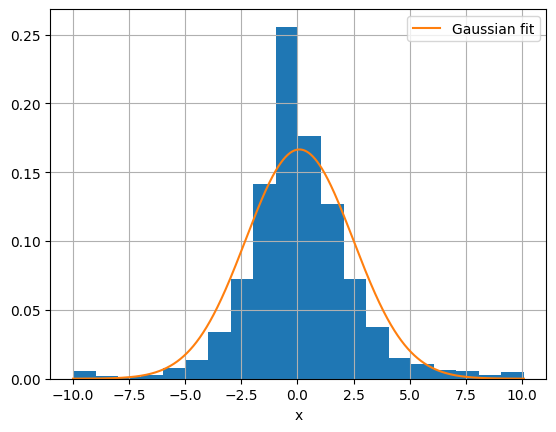

In [23]:

# Plot histogram of the daily returns
ax = df['daily_ret'].hist(bins=20, density=True)
gauss_df.plot(x='x', y='y', grid=True, ax=ax)
plt.legend(['Gaussian fit'])

In [24]:
fig = ff.create_distplot([np.array(df['daily_ret'][1:])], 
                         ['distplot'], 
                         bin_size=.1,
                         curve_type='normal', # override default 'kde'
                         )

# Add title
fig.update_layout(title_text='Distplot of daily returns with Normal Distribution')
fig.show()

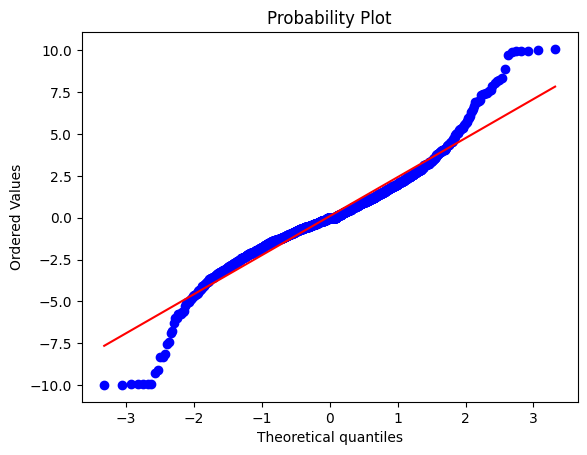

In [25]:
# Plot QQ plot
stats.probplot(df['daily_ret'][1:], dist="norm", plot=pylab)
pylab.show()

In [26]:
# Plot with plotly
data = [go.Scatter(
            x = df['date'],
            y = df['adj_close'],
            mode = 'lines')]

layout = dict(xaxis = dict(title = 'date'),
              yaxis = dict(title = 'TRY'))

fig = dict(data=data, layout=layout)
pyo.iplot(fig, filename=filename)

In [27]:
# Simple moving average
df['sma_10'] = df['adj_close'].rolling(window = 10).mean()
df['sma_20'] = df['adj_close'].rolling(window = 20).mean()
df['sma_50'] = df['adj_close'].rolling(window = 50).mean()
df['sma_100'] = df['adj_close'].rolling(window = 100).mean()
df['sma_200'] = df['adj_close'].rolling(window = 200).mean()

# Get the sma on the previous day
df['adj_close_lag_1'] = df['adj_close'].shift(1)
df['sma_10_lag_1'] = df['sma_10'].shift(1)
df['sma_20_lag_1'] = df['sma_20'].shift(1)
df['sma_50_lag_1'] = df['sma_50'].shift(1)
df['sma_100_lag_1'] = df['sma_100'].shift(1)
df['sma_200_lag_1'] = df['sma_200'].shift(1)

# Get above signals
df['sma_above20'] = (df['adj_close'] > df['sma_20']).astype(int)
df['sma_above50'] = (df['adj_close'] > df['sma_50']).astype(int)
df['sma_above100'] = (df['adj_close'] > df['sma_100']).astype(int)
df['sma_above200'] = (df['adj_close'] > df['sma_200']).astype(int)

df['sma_10above20'] = (df['sma_10'] > df['sma_20']).astype(int)
df['sma_10above50'] = (df['sma_10'] > df['sma_50']).astype(int)
df['sma_10above100'] = (df['sma_10'] > df['sma_100']).astype(int)
df['sma_10above200'] = (df['sma_10'] > df['sma_200']).astype(int)

# Get bullish crossover signals
df['sma_cut20'] = ((df['adj_close_lag_1'] < df['sma_20_lag_1']) & (df['sma_above20']==True)).astype(int)
df['sma_cut50'] = ((df['adj_close_lag_1'] < df['sma_50_lag_1']) & (df['sma_above50']==True)).astype(int)
df['sma_cut100'] = ((df['adj_close_lag_1'] < df['sma_100_lag_1']) & (df['sma_above100']==True)).astype(int)
df['sma_cut200'] = ((df['adj_close_lag_1'] < df['sma_200_lag_1']) & (df['sma_above200']==True)).astype(int)

df['sma_10cut20'] = ((df['sma_10_lag_1'] < df['sma_20_lag_1']) & (df['sma_10above20']==True)).astype(int)
df['sma_10cut50'] = ((df['sma_10_lag_1'] < df['sma_50_lag_1']) & (df['sma_10above50']==True)).astype(int)
df['sma_10cut100'] = ((df['sma_10_lag_1'] < df['sma_100_lag_1']) & (df['sma_10above100']==True)).astype(int)
df['sma_10cut200'] = ((df['sma_10_lag_1'] < df['sma_200_lag_1']) & (df['sma_10above200']==True)).astype(int)

# Get bearish crossover signals
df['sma_cut20down'] = ((df['adj_close_lag_1'] > df['sma_20_lag_1']) & (df['adj_close'] < df['sma_20'])).astype(int)
df['sma_cut50down'] = ((df['adj_close_lag_1'] > df['sma_50_lag_1']) & (df['adj_close'] < df['sma_50'])).astype(int)
df['sma_cut100down'] = ((df['adj_close_lag_1'] > df['sma_100_lag_1']) & (df['adj_close'] < df['sma_100'])).astype(int)
df['sma_cut200down'] = ((df['adj_close_lag_1'] > df['sma_200_lag_1']) & (df['adj_close'] < df['sma_200'])).astype(int)

df['sma_10cut20down'] = ((df['sma_10_lag_1'] > df['sma_20_lag_1']) & (df['sma_10'] < df['sma_20'])).astype(int)
df['sma_10cut50down'] = ((df['sma_10_lag_1'] > df['sma_50_lag_1']) & (df['sma_10'] < df['sma_50'])).astype(int)
df['sma_10cut100down'] = ((df['sma_10_lag_1'] > df['sma_100_lag_1']) & (df['sma_10'] < df['sma_100'])).astype(int)
df['sma_10cut200down'] = ((df['sma_10_lag_1'] > df['sma_200_lag_1']) & (df['sma_10'] < df['sma_200'])).astype(int)

df[:50]

,date,open,high,low,close,adj_close,volume,daily_ret,sma_10,sma_20,...,sma_10cut100,sma_10cut200,sma_cut20down,sma_cut50down,sma_cut100down,sma_cut200down,sma_10cut20down,sma_10cut50down,sma_10cut100down,sma_10cut200down
0,2016-11-11,6.790967,6.825265,6.628053,6.636627,5.854577,26498904,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
1,2016-11-14,6.662350,6.696648,6.610904,6.628053,5.847013,20974050,-0.129191,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
2,2016-11-15,6.662350,6.773818,6.662350,6.765244,5.968038,24600011,2.069854,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
3,2016-11-16,6.790967,6.799542,6.628053,6.670925,5.884833,24711955,-1.394173,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
4,2016-11-17,6.705223,6.765244,6.653776,6.670925,5.884833,22566806,0.000000,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
5,2016-11-18,6.645201,6.773818,6.602329,6.756669,5.960474,30873799,1.285350,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
6,2016-11-21,6.773818,6.782393,6.679499,6.705223,5.915090,18540534,-0.761415,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
7,2016-11-22,6.705223,6.859563,6.696648,6.833839,6.028549,34135469,1.918138,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
8,2016-11-23,6.850988,6.876712,6.679499,6.679499,5.892396,18928950,-2.258466,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
9,2016-11-24,6.670925,6.773818,6.508010,6.550882,5.778935,33661149,-1.925550,5.901474,NaN,...,0,0,0,0,0,0,0,0,0,0


In [28]:
signals = df[df['sma_10cut200']==1]

# Plot validation predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_10'], 
                         mode='lines', 
                         name='sma_10', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_20'], 
                         mode='lines', 
                         name='sma_20', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_50'], 
                         mode='lines', 
                         name='sma_50', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_100'], 
                         mode='lines', 
                         name='sma_100', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_200'], 
                         mode='lines', 
                         name='sma_200', 
                         ))

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ))
    n = n+1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))

# py.iplot(fig, filename='VTI_20130102_20181231_sma')

In [29]:
# Del unneccesary cols
df.drop(['sma_10', 'sma_50', 'sma_100', 'sma_200',
            'sma_10_lag_1', 'sma_20_lag_1', 'sma_50_lag_1', 'sma_100_lag_1', 'sma_200_lag_1'], axis=1, inplace=True)


In [30]:
# Exponential moving average
df['ema_10'] = df['adj_close'].ewm(span = 10, adjust=False).mean()
df['ema_20'] = df['adj_close'].ewm(span = 20, adjust=False).mean()
df['ema_50'] = df['adj_close'].ewm(span = 50, adjust=False).mean()
df['ema_100'] = df['adj_close'].ewm(span = 100, adjust=False).mean()
df['ema_200'] = df['adj_close'].ewm(span = 200, adjust=False).mean()

# Get the ema on the previous day
df['adj_close_lag_1'] = df['adj_close'].shift(1)
df['ema_10_lag_1'] = df['ema_10'].shift(1)
df['ema_20_lag_1'] = df['ema_20'].shift(1)
df['ema_50_lag_1'] = df['ema_50'].shift(1)
df['ema_100_lag_1'] = df['ema_100'].shift(1)
df['ema_200_lag_1'] = df['ema_200'].shift(1)

# Get above signals
df['ema_above20'] = (df['adj_close'] > df['ema_20']).astype(int)
df['ema_above50'] = (df['adj_close'] > df['ema_50']).astype(int)
df['ema_above100'] = (df['adj_close'] > df['ema_100']).astype(int)
df['ema_above200'] = (df['adj_close'] > df['ema_200']).astype(int)

df['ema_10above20'] = (df['ema_10'] > df['ema_20']).astype(int)
df['ema_10above50'] = (df['ema_10'] > df['ema_50']).astype(int)
df['ema_10above100'] = (df['ema_10'] > df['ema_100']).astype(int)
df['ema_10above200'] = (df['ema_10'] > df['ema_200']).astype(int)

# Get bullish crossover signals
df['ema_cut20'] = ((df['adj_close_lag_1'] < df['ema_20_lag_1']) & (df['ema_above20']==True)).astype(int)
df['ema_cut50'] = ((df['adj_close_lag_1'] < df['ema_50_lag_1']) & (df['ema_above50']==True)).astype(int)
df['ema_cut100'] = ((df['adj_close_lag_1'] < df['ema_100_lag_1']) & (df['ema_above100']==True)).astype(int)
df['ema_cut200'] = ((df['adj_close_lag_1'] < df['ema_200_lag_1']) & (df['ema_above200']==True)).astype(int)

df['ema_10cut20'] = ((df['ema_10_lag_1'] < df['ema_20_lag_1']) & (df['ema_10above20']==True)).astype(int)
df['ema_10cut50'] = ((df['ema_10_lag_1'] < df['ema_50_lag_1']) & (df['ema_10above50']==True)).astype(int)
df['ema_10cut100'] = ((df['ema_10_lag_1'] < df['ema_100_lag_1']) & (df['ema_10above100']==True)).astype(int)
df['ema_10cut200'] = ((df['ema_10_lag_1'] < df['ema_200_lag_1']) & (df['ema_10above200']==True)).astype(int)

# Get bearish crossover signals
df['ema_cut20down'] = ((df['adj_close_lag_1'] > df['ema_20_lag_1']) & (df['adj_close'] < df['ema_20'])).astype(int)
df['ema_cut50down'] = ((df['adj_close_lag_1'] > df['ema_50_lag_1']) & (df['adj_close'] < df['ema_50'])).astype(int)
df['ema_cut100down'] = ((df['adj_close_lag_1'] > df['ema_100_lag_1']) & (df['adj_close'] < df['ema_100'])).astype(int)
df['ema_cut200down'] = ((df['adj_close_lag_1'] > df['ema_200_lag_1']) & (df['adj_close'] < df['ema_200'])).astype(int)

df['ema_10cut20down'] = ((df['ema_10_lag_1'] > df['ema_20_lag_1']) & (df['ema_10'] < df['ema_20'])).astype(int)
df['ema_10cut50down'] = ((df['ema_10_lag_1'] > df['ema_50_lag_1']) & (df['ema_10'] < df['ema_50'])).astype(int)
df['ema_10cut100down'] = ((df['ema_10_lag_1'] > df['ema_100_lag_1']) & (df['ema_10'] < df['ema_100'])).astype(int)
df['ema_10cut200down'] = ((df['ema_10_lag_1'] > df['ema_200_lag_1']) & (df['ema_10'] < df['ema_200'])).astype(int)

df

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,ema_10cut100,ema_10cut200,ema_cut20down,ema_cut50down,ema_cut100down,ema_cut200down,ema_10cut20down,ema_10cut50down,ema_10cut100down,ema_10cut200down
0,2016-11-11,6.790967,6.825265,6.628053,6.636627,5.854577,26498904,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
1,2016-11-14,6.662350,6.696648,6.610904,6.628053,5.847013,20974050,-0.129191,NaN,5.854577,...,0,0,0,0,0,0,0,0,0,0
2,2016-11-15,6.662350,6.773818,6.662350,6.765244,5.968038,24600011,2.069854,NaN,5.847013,...,1,1,0,0,0,0,0,0,0,0
3,2016-11-16,6.790967,6.799542,6.628053,6.670925,5.884833,24711955,-1.394173,NaN,5.968038,...,0,0,0,0,0,0,0,0,0,0
4,2016-11-17,6.705223,6.765244,6.653776,6.670925,5.884833,22566806,0.000000,NaN,5.884833,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1530,2022-11-07,14.770000,15.320000,14.760000,15.240000,15.240000,192680049,4.598491,14.6870,14.570000,...,0,0,0,0,0,0,0,0,0,0
1531,2022-11-08,15.290000,15.590000,14.980000,15.210000,15.210000,201986838,-0.196849,14.7945,15.240000,...,0,0,0,0,0,0,0,0,0,0
1532,2022-11-09,15.240000,15.380000,14.860000,14.940000,14.940000,154904351,-1.775151,14.8950,15.210000,...,0,0,0,0,0,0,0,0,0,0
1533,2022-11-10,14.950000,15.530000,14.940000,15.430000,15.430000,188682288,3.279791,15.0160,14.940000,...,0,0,0,0,0,0,0,0,0,0


In [31]:
signals = df[df['ema_10cut200']==1]

# Plot validation predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_10'], 
                         mode='lines', 
                         name='ema_10', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_20'], 
                         mode='lines', 
                         name='ema_20', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_50'], 
                         mode='lines', 
                         name='ema_50', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_100'], 
                         mode='lines', 
                         name='ema_100', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_200'], 
                         mode='lines', 
                         name='ema_200', 
                         ))

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ))
    n = n+1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))

# py.iplot(fig, filename='VTI_20130102_20181231_ema')

In [32]:
# Del unneccesary cols
df.drop(['ema_10', 'ema_20', 'ema_50', 'ema_100', 'ema_200',
         'ema_10_lag_1', 'ema_20_lag_1', 'ema_50_lag_1', 'ema_100_lag_1', 'ema_200_lag_1'], axis=1, inplace=True)


In [33]:
# Exponential moving average
df['ema_12'] = df['adj_close'].ewm(span=12, adjust=False).mean()
df['ema_26'] = df['adj_close'].ewm(span=26, adjust=False).mean()

# MACD
df['macd'] = df['ema_12'] - df['ema_26']
df['macd_signal'] = df['macd'].ewm(span=9, adjust=False).mean()

# Get the macd on the previous day
df['macd_lag_1'] = df['macd'].shift(1)
df['macd_signal_lag_1'] = df['macd_signal'].shift(1)

# Get bullish crossover signals
df['macd_crossover'] = ((df['macd_lag_1'] < df['macd_signal_lag_1']) & \
                        (df['macd'] > df['macd_signal'])).astype(int)

# Get bearish crossover signals
df['macd_crossoverdown'] = ((df['macd_lag_1'] > df['macd_signal_lag_1']) & \
                        (df['macd'] < df['macd_signal'])).astype(int)


In [34]:
df.head()

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,ema_10cut100down,ema_10cut200down,ema_12,ema_26,macd,macd_signal,macd_lag_1,macd_signal_lag_1,macd_crossover,macd_crossoverdown
0,2016-11-11,6.790967,6.825265,6.628053,6.636627,5.854577,26498904,NaN,NaN,NaN,...,0,0,5.854577,5.854577,0.000000,0.000000,NaN,NaN,0,0
1,2016-11-14,6.662350,6.696648,6.610904,6.628053,5.847013,20974050,-0.129191,NaN,5.854577,...,0,0,5.853413,5.854016,-0.000603,-0.000121,0.000000,0.000000,0,0
2,2016-11-15,6.662350,6.773818,6.662350,6.765244,5.968038,24600011,2.069854,NaN,5.847013,...,0,0,5.871048,5.862462,0.008585,0.001620,-0.000603,-0.000121,1,0
3,2016-11-16,6.790967,6.799542,6.628053,6.670925,5.884833,24711955,-1.394173,NaN,5.968038,...,0,0,5.873168,5.864119,0.009049,0.003106,0.008585,0.001620,0,0
4,2016-11-17,6.705223,6.765244,6.653776,6.670925,5.884833,22566806,0.000000,NaN,5.884833,...,0,0,5.874963,5.865654,0.009309,0.004347,0.009049,0.003106,0,0


In [35]:
signals = df[df['macd_crossover']==1]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_12'], 
                         mode='lines', 
                         name='ema_12', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_26'], 
                         mode='lines', 
                         name='ema_26', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['macd'], 
                         mode='lines', 
                         name='macd', 
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['macd_signal'], 
                         mode='lines', 
                         name='macd_signal', 
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_macd')

In [36]:
df.drop(['ema_12', 'ema_26', 'macd_signal', 'macd_lag_1', 'macd_signal_lag_1'], axis=1, inplace=True)

In [37]:
# Generate fast and slow stochastic oscillators
df['lowest_14'] = df['close'].rolling(window = 14).min()
df['highest_14'] = df['close'].rolling(window = 14).max()
df['stochastic_fast'] = 100.0*(df['close'] - df['lowest_14'])/(df['highest_14'] - df['lowest_14'])
df['stochastic_slow'] = df['stochastic_fast'].rolling(window = 3).mean()

# Get the stochastics on the previous day
df['stochastic_fast_lag_1'] = df['stochastic_fast'].shift(1)
df['stochastic_slow_lag_1'] = df['stochastic_slow'].shift(1)

# Get bullish crossover signals
df['stochastic_fastcutslow'] = ((df['stochastic_fast_lag_1'] < df['stochastic_slow_lag_1']) & \
                                (df['stochastic_fast'] > df['stochastic_slow'])).astype(int)

# Get bearish crossover signals
df['stochastic_fastcutslowdown'] = ((df['stochastic_fast_lag_1'] > df['stochastic_slow_lag_1']) & \
                                (df['stochastic_fast'] < df['stochastic_slow'])).astype(int)

# Get overbought/oversold signals
df['stochastic_overs'] = (df['stochastic_fast'] < 20).astype(int)
df['stochastic_overb'] = (df['stochastic_fast'] > 80).astype(int)

df[:50]

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,lowest_14,highest_14,stochastic_fast,stochastic_slow,stochastic_fast_lag_1,stochastic_slow_lag_1,stochastic_fastcutslow,stochastic_fastcutslowdown,stochastic_overs,stochastic_overb
0,2016-11-11,6.790967,6.825265,6.628053,6.636627,5.854577,26498904,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
1,2016-11-14,6.662350,6.696648,6.610904,6.628053,5.847013,20974050,-0.129191,NaN,5.854577,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
2,2016-11-15,6.662350,6.773818,6.662350,6.765244,5.968038,24600011,2.069854,NaN,5.847013,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
3,2016-11-16,6.790967,6.799542,6.628053,6.670925,5.884833,24711955,-1.394173,NaN,5.968038,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
4,2016-11-17,6.705223,6.765244,6.653776,6.670925,5.884833,22566806,0.000000,NaN,5.884833,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
5,2016-11-18,6.645201,6.773818,6.602329,6.756669,5.960474,30873799,1.285350,NaN,5.884833,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
6,2016-11-21,6.773818,6.782393,6.679499,6.705223,5.915090,18540534,-0.761415,NaN,5.960474,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
7,2016-11-22,6.705223,6.859563,6.696648,6.833839,6.028549,34135469,1.918138,NaN,5.915090,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
8,2016-11-23,6.850988,6.876712,6.679499,6.679499,5.892396,18928950,-2.258466,NaN,6.028549,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
9,2016-11-24,6.670925,6.773818,6.508010,6.550882,5.778935,33661149,-1.925550,NaN,5.892396,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0


In [38]:
signals = df[df['stochastic_fastcutslow']==1]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['stochastic_fast'], 
                         mode='lines', 
                         name='stochastic_fast', 
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['stochastic_slow'], 
                         mode='lines', 
                         name='stochastic_fast', 
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_stochastic_osc')

In [39]:
signals = df[df['stochastic_overs']==True]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['stochastic_fast'], 
                         mode='lines', 
                         name='stochastic_fast', 
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[20]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[80]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_stochastic_osc_obos')

In [40]:
# Del unneccesary cols
df.drop(['lowest_14', 
         'highest_14', 
         'stochastic_fast_lag_1', 
         'stochastic_slow_lag_1'], axis=1, inplace=True)

In [41]:
# Get gain and loss columns
df['gain'] = df['daily_ret']
df.loc[df['gain']<0, 'gain'] = 0

df['loss'] = df['daily_ret']
df.loc[df['loss']>0, 'loss'] = 0
df['loss'] = abs(df['loss'])

# Get avg_gain, avg_loss columns
df['avg_gain'] = df['gain'].rolling(window = 14).mean()
df['avg_loss'] = df['loss'].rolling(window = 14).mean()

for index, row in df[15:].iterrows():
    df.loc[index, 'avg_gain'] = (df.loc[index-1, 'avg_gain']*13 + row['gain'])/14
    df.loc[index, 'avg_loss'] = (df.loc[index-1, 'avg_loss']*13 + row['loss'])/14
    
# Calc RSI
df['rsi'] = 100 - 100/(1+(df['avg_gain']/df['avg_loss']))
df['rsi_ob'] = (df['rsi'] > 70).astype(int)
df['rsi_os'] = (df['rsi'] < 30).astype(int)

df[:50]

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,stochastic_fastcutslowdown,stochastic_overs,stochastic_overb,gain,loss,avg_gain,avg_loss,rsi,rsi_ob,rsi_os
0,2016-11-11,6.790967,6.825265,6.628053,6.636627,5.854577,26498904,NaN,NaN,NaN,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
1,2016-11-14,6.662350,6.696648,6.610904,6.628053,5.847013,20974050,-0.129191,NaN,5.854577,...,0,0,0,0.000000,0.129191,NaN,NaN,NaN,0,0
2,2016-11-15,6.662350,6.773818,6.662350,6.765244,5.968038,24600011,2.069854,NaN,5.847013,...,0,0,0,2.069854,0.000000,NaN,NaN,NaN,0,0
3,2016-11-16,6.790967,6.799542,6.628053,6.670925,5.884833,24711955,-1.394173,NaN,5.968038,...,0,0,0,0.000000,1.394173,NaN,NaN,NaN,0,0
4,2016-11-17,6.705223,6.765244,6.653776,6.670925,5.884833,22566806,0.000000,NaN,5.884833,...,0,0,0,0.000000,0.000000,NaN,NaN,NaN,0,0
5,2016-11-18,6.645201,6.773818,6.602329,6.756669,5.960474,30873799,1.285350,NaN,5.884833,...,0,0,0,1.285350,0.000000,NaN,NaN,NaN,0,0
6,2016-11-21,6.773818,6.782393,6.679499,6.705223,5.915090,18540534,-0.761415,NaN,5.960474,...,0,0,0,0.000000,0.761415,NaN,NaN,NaN,0,0
7,2016-11-22,6.705223,6.859563,6.696648,6.833839,6.028549,34135469,1.918138,NaN,5.915090,...,0,0,0,1.918138,0.000000,NaN,NaN,NaN,0,0
8,2016-11-23,6.850988,6.876712,6.679499,6.679499,5.892396,18928950,-2.258466,NaN,6.028549,...,0,0,0,0.000000,2.258466,NaN,NaN,NaN,0,0
9,2016-11-24,6.670925,6.773818,6.508010,6.550882,5.778935,33661149,-1.925550,NaN,5.892396,...,0,0,0,0.000000,1.925550,NaN,NaN,NaN,0,0


In [42]:
signals = df[df['rsi_os']==1]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['rsi'], 
                         mode='lines', 
                         name='rsi', 
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[30]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[70]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_rsi')

In [43]:
# Del unneccesary cols
df.drop(['gain', 
         'loss'
        ], axis=1, inplace=True)

In [44]:
# Get atr
df['close_lag_1'] = df['close'].shift(1)
df['tr'] = np.maximum(df['high']-df['low'], np.maximum(abs(df['high']-df['close_lag_1']), abs(df['low']-df['close_lag_1'])))
df['atr'] = df['tr'].rolling(window = 14).mean()

# Get bullish atr signal - buy when next day's price is above yesterday's closing + atr
df['atr_signal'] = (df['high'] > ((df['close_lag_1'] + df['atr']))).astype(int)

# Get bearish atr signal - sell when next day's price is below yesterday's closing - atr
df['atr_signaldown'] = (df['low'] < ((df['close_lag_1'] - df['atr']))).astype(int)

df

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,avg_gain,avg_loss,rsi,rsi_ob,rsi_os,close_lag_1,tr,atr,atr_signal,atr_signaldown
0,2016-11-11,6.790967,6.825265,6.628053,6.636627,5.854577,26498904,NaN,NaN,NaN,...,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,0
1,2016-11-14,6.662350,6.696648,6.610904,6.628053,5.847013,20974050,-0.129191,NaN,5.854577,...,NaN,NaN,NaN,0,0,6.636627,0.085744,NaN,0,0
2,2016-11-15,6.662350,6.773818,6.662350,6.765244,5.968038,24600011,2.069854,NaN,5.847013,...,NaN,NaN,NaN,0,0,6.628053,0.145765,NaN,0,0
3,2016-11-16,6.790967,6.799542,6.628053,6.670925,5.884833,24711955,-1.394173,NaN,5.968038,...,NaN,NaN,NaN,0,0,6.765244,0.171489,NaN,0,0
4,2016-11-17,6.705223,6.765244,6.653776,6.670925,5.884833,22566806,0.000000,NaN,5.884833,...,NaN,NaN,NaN,0,0,6.670925,0.111468,NaN,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1530,2022-11-07,14.770000,15.320000,14.760000,15.240000,15.240000,192680049,4.598491,14.6870,14.570000,...,1.560769,0.923993,62.813625,0,0,14.570000,0.750000,0.590714,1,0
1531,2022-11-08,15.290000,15.590000,14.980000,15.210000,15.210000,201986838,-0.196849,14.7945,15.240000,...,1.449285,0.872054,62.433155,0,0,15.240000,0.610001,0.565714,0,0
1532,2022-11-09,15.240000,15.380000,14.860000,14.940000,14.940000,154904351,-1.775151,14.8950,15.210000,...,1.345765,0.936561,58.964629,0,0,15.210000,0.520000,0.557143,0,0
1533,2022-11-10,14.950000,15.530000,14.940000,15.430000,15.430000,188682288,3.279791,15.0160,14.940000,...,1.483909,0.869664,63.049222,0,0,14.940000,0.590000,0.572143,1,0


In [45]:
signals = df[df['atr_signal']==1]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['atr'], 
                         mode='lines', 
                         name='atr', 
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_atr')

In [46]:
df.drop(['close_lag_1'], axis=1, inplace=True)  

In [47]:
# Get +/- directional movement
df['high_lag_1'] = df['high'].shift(1)
df['low_lag_1'] = df['low'].shift(1)

def comp_pdm(high, high_lag_1, low, low_lag_1):
    if (high-high_lag_1) > (low_lag_1-low):
        return(max(high-high_lag_1, 0))
    else:
        return 0
    
df['+dm'] = df.apply(lambda row: comp_pdm(row['high'], row['high_lag_1'], row['low'], row['low_lag_1']), axis=1)
    
def comp_mdm(high, high_lag_1, low, low_lag_1):
    if (low_lag_1-low) > (high-high_lag_1):
        return(max(low_lag_1-low, 0))
    else:
        return 0

df['-dm'] = df.apply(lambda row: comp_mdm(row['high'], row['high_lag_1'], row['low'], row['low_lag_1']), axis=1)
    
    
# Get smoothed +/- directional movement
df['smoothed+dm'] = 0
df.loc[14, 'smoothed+dm'] = df[1:15]['+dm'].sum()

df['smoothed-dm'] = 0
df.loc[14, 'smoothed-dm'] = df[1:15]['-dm'].sum()

df['14tr'] = 0
df.loc[14, '14tr'] = df[1:15]['tr'].sum()

for index, row in df[15:].iterrows():
    df.loc[index, 'smoothed+dm'] = df.loc[index-1, 'smoothed+dm'] - (df.loc[index-1, 'smoothed+dm']/14) + row['+dm']
    df.loc[index, 'smoothed-dm'] = df.loc[index-1, 'smoothed-dm'] - (df.loc[index-1, 'smoothed-dm']/14) + row['-dm']
    df.loc[index, '14tr'] = df.loc[index-1, '14tr'] - (df.loc[index-1, '14tr']/14) + row['tr']
    
# Get +/- directional index
df['+di'] = 100.0*(df['smoothed+dm']/df['14tr'])
df['-di'] = 100.0*(df['smoothed-dm']/df['14tr'])

# Get directional movement index
df['dx'] = 100.0 * (abs(df['+di']-df['-di'])/abs(df['+di']+df['-di']))

# Get average directional movement index
df.loc[27, 'adx'] = df[14:28]['dx'].mean()
for index, row in df[28:].iterrows():
    df.loc[index, 'adx'] = (df.loc[index-1, 'adx']*13 + row['dx'])/14
    
# Get adx strength and trendless
df['adx_strength'] = (df['adx'] > 25).astype(int)
df['adx_trendless'] = (df['adx'] < 20).astype(int)

# Get adx signals
df['+di_lag_1'] = df['+di'].shift(1)
df['-di_lag_1'] = df['-di'].shift(1)
df['adx_bull'] = ((df['+di_lag_1'] < df['-di_lag_1']) & (df['+di'] > df['-di']) & (df['adx_strength']==True)).astype(int)
df['adx_bear'] = ((df['-di_lag_1'] < df['+di_lag_1']) & (df['-di'] > df['+di']) & (df['adx_strength']==True)).astype(int)

df[:50]

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,+di,-di,dx,adx,adx_strength,adx_trendless,+di_lag_1,-di_lag_1,adx_bull,adx_bear
0,2016-11-11,6.790967,6.825265,6.628053,6.636627,5.854577,26498904,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
1,2016-11-14,6.662350,6.696648,6.610904,6.628053,5.847013,20974050,-0.129191,NaN,5.854577,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
2,2016-11-15,6.662350,6.773818,6.662350,6.765244,5.968038,24600011,2.069854,NaN,5.847013,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
3,2016-11-16,6.790967,6.799542,6.628053,6.670925,5.884833,24711955,-1.394173,NaN,5.968038,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
4,2016-11-17,6.705223,6.765244,6.653776,6.670925,5.884833,22566806,0.000000,NaN,5.884833,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
5,2016-11-18,6.645201,6.773818,6.602329,6.756669,5.960474,30873799,1.285350,NaN,5.884833,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
6,2016-11-21,6.773818,6.782393,6.679499,6.705223,5.915090,18540534,-0.761415,NaN,5.960474,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
7,2016-11-22,6.705223,6.859563,6.696648,6.833839,6.028549,34135469,1.918138,NaN,5.915090,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
8,2016-11-23,6.850988,6.876712,6.679499,6.679499,5.892396,18928950,-2.258466,NaN,6.028549,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
9,2016-11-24,6.670925,6.773818,6.508010,6.550882,5.778935,33661149,-1.925550,NaN,5.892396,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0


In [48]:
signals = df[df['adx_bull']==1]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adx'], 
                         mode='lines', 
                         name='adx', 
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[20]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[25]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_adx')

In [49]:
# Del unneccesary cols
df.drop(['+di',
         '-di',
         '+di_lag_1',
         '-di_lag_1',
         'tr', 
         '+dm', 
         '-dm', 
         'smoothed+dm',
         'smoothed-dm',
         '14tr',
         'dx',
         'tr'], axis=1, inplace=True)

In [50]:
df['std_20'] = df['adj_close'].rolling(window = 20).std()
df['bollinger_upp'] = df['sma_20'] + 2*df['std_20']
df['bollinger_low'] = df['sma_20'] - 2*df['std_20']

# Get dist between bollinger bands and the price
df['bollinger_upp_dist'] = df['bollinger_upp'] - df['adj_close']
df['bollinger_low_dist'] = df['adj_close'] - df['bollinger_low']

# Get signals
df['bollinger_ob'] = (df['adj_close'] > df['bollinger_upp']).astype(int)
df['bollinger_os'] = (df['adj_close'] < df['bollinger_low']).astype(int)

df

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,adx_trendless,adx_bull,adx_bear,std_20,bollinger_upp,bollinger_low,bollinger_upp_dist,bollinger_low_dist,bollinger_ob,bollinger_os
0,2016-11-11,6.790967,6.825265,6.628053,6.636627,5.854577,26498904,NaN,NaN,NaN,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
1,2016-11-14,6.662350,6.696648,6.610904,6.628053,5.847013,20974050,-0.129191,NaN,5.854577,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
2,2016-11-15,6.662350,6.773818,6.662350,6.765244,5.968038,24600011,2.069854,NaN,5.847013,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
3,2016-11-16,6.790967,6.799542,6.628053,6.670925,5.884833,24711955,-1.394173,NaN,5.968038,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
4,2016-11-17,6.705223,6.765244,6.653776,6.670925,5.884833,22566806,0.000000,NaN,5.884833,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1530,2022-11-07,14.770000,15.320000,14.760000,15.240000,15.240000,192680049,4.598491,14.6870,14.570000,...,0,0,0,0.931683,16.550365,12.823635,1.310365,2.416365,0,0
1531,2022-11-08,15.290000,15.590000,14.980000,15.210000,15.210000,201986838,-0.196849,14.7945,15.240000,...,0,0,0,0.854951,16.504403,13.084597,1.294403,2.125403,0,0
1532,2022-11-09,15.240000,15.380000,14.860000,14.940000,14.940000,154904351,-1.775151,14.8950,15.210000,...,0,0,0,0.733797,16.362594,13.427406,1.422594,1.512593,0,0
1533,2022-11-10,14.950000,15.530000,14.940000,15.430000,15.430000,188682288,3.279791,15.0160,14.940000,...,0,0,0,0.592536,16.201072,13.830928,0.771072,1.599072,0,0


In [51]:
signals = df[df['bollinger_os']==True]

# Plot validation predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['bollinger_upp'], 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dot'),
                         name='bollinger_upp', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['bollinger_low'], 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dot'),
                         name='bollinger_low', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_20'], 
                         mode='lines', 
                         name='sma_20', 
                         ))

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ))
    n = n+1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))

# py.iplot(fig, filename='VTI_20130102_20181231_bollinger')

In [52]:
# Del unneccesary cols
df.drop(['std_20', 'bollinger_upp', 'bollinger_low'], axis=1, inplace=True)

In [53]:
# Check if all signals true on any day
df[(df['macd_crossover']==1) & 
   (df['stochastic_fastcutslow']==1) &
   (df['atr_signal']==1) & 
   (df['adx_bull']==1)]

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,low_lag_1,adx,adx_strength,adx_trendless,adx_bull,adx_bear,bollinger_upp_dist,bollinger_low_dist,bollinger_ob,bollinger_os


In [54]:
# Remove unnecessary cols
df.drop(['open',
         'high', 
         'low',
         'close',
         'volume',
         'sma_20',
         'adj_close_lag_1',
         'high_lag_1',
         'low_lag_1',
         ], axis=1, inplace=True)

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1535 entries, 0 to 1534
Data columns (total 77 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   date                        1535 non-null   datetime64[ns]
 1   adj_close                   1535 non-null   float64       
 2   daily_ret                   1534 non-null   float64       
 3   sma_above20                 1535 non-null   int64         
 4   sma_above50                 1535 non-null   int64         
 5   sma_above100                1535 non-null   int64         
 6   sma_above200                1535 non-null   int64         
 7   sma_10above20               1535 non-null   int64         
 8   sma_10above50               1535 non-null   int64         
 9   sma_10above100              1535 non-null   int64         
 10  sma_10above200              1535 non-null   int64         
 11  sma_cut20                   1535 non-null   int64       

In [56]:
# Count number of nulls for each column
df.isnull().sum(axis=0)

date                   0
adj_close              0
daily_ret              1
sma_above20            0
sma_above50            0
                      ..
adx_bear               0
bollinger_upp_dist    19
bollinger_low_dist    19
bollinger_ob           0
bollinger_os           0
Length: 77, dtype: int64

In [57]:
# Create lags 
df_lags = add_lags(df, N, ['daily_ret'])
df_lags

,date,adj_close,daily_ret,sma_above20,sma_above50,sma_above100,sma_above200,sma_10above20,sma_10above50,sma_10above100,...,daily_ret_lag_1,daily_ret_lag_2,daily_ret_lag_3,daily_ret_lag_4,daily_ret_lag_5,daily_ret_lag_6,daily_ret_lag_7,daily_ret_lag_8,daily_ret_lag_9,daily_ret_lag_10
0,2016-11-11,5.854577,NaN,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-11-14,5.847013,-0.129191,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-11-15,5.968038,2.069854,0,0,0,0,0,0,0,...,-0.129191,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-11-16,5.884833,-1.394173,0,0,0,0,0,0,0,...,2.069854,-0.129191,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-11-17,5.884833,0.000000,0,0,0,0,0,0,0,...,-1.394173,2.069854,-0.129191,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1530,2022-11-07,15.240000,4.598491,1,1,1,1,1,1,1,...,2.677943,-1.799310,-0.687288,-0.478794,-0.408722,-3.611289,-3.485426,1.675253,0.388101,-0.578779
1531,2022-11-08,15.210000,-0.196849,1,1,1,1,1,1,1,...,4.598491,2.677943,-1.799310,-0.687288,-0.478794,-0.408722,-3.611289,-3.485426,1.675253,0.388101
1532,2022-11-09,14.940000,-1.775151,1,1,1,1,0,1,1,...,-0.196849,4.598491,2.677943,-1.799310,-0.687288,-0.478794,-0.408722,-3.611289,-3.485426,1.675253
1533,2022-11-10,15.430000,3.279791,1,1,1,1,0,1,1,...,-1.775151,-0.196849,4.598491,2.677943,-1.799310,-0.687288,-0.478794,-0.408722,-3.611289,-3.485426


In [58]:
# Create lags for technical indicators
tech_indicators = list(set(df.columns) - set(['date', 'adj_close', 'daily_ret']))
df_lags = add_lags(df_lags, 1, tech_indicators)

# Remove columns
df_lags.drop(tech_indicators, axis=1, inplace=True)

df_lags

,date,adj_close,daily_ret,order_day,daily_ret_lag_1,daily_ret_lag_2,daily_ret_lag_3,daily_ret_lag_4,daily_ret_lag_5,daily_ret_lag_6,...,atr_lag_1,macd_crossover_lag_1,stochastic_overs_lag_1,ema_cut20_lag_1,sma_above100_lag_1,sma_10cut50_lag_1,adx_trendless_lag_1,sma_above200_lag_1,macd_lag_1,ema_cut100down_lag_1
0,2016-11-11,5.854577,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-11-14,5.847013,-0.129191,1,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2,2016-11-15,5.968038,2.069854,2,-0.129191,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.000603,0.0
3,2016-11-16,5.884833,-1.394173,3,2.069854,-0.129191,NaN,NaN,NaN,NaN,...,NaN,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.008585,0.0
4,2016-11-17,5.884833,0.000000,4,-1.394173,2.069854,-0.129191,NaN,NaN,NaN,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.009049,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1530,2022-11-07,15.240000,4.598491,1530,2.677943,-1.799310,-0.687288,-0.478794,-0.408722,-3.611289,...,0.620000,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.449680,0.0
1531,2022-11-08,15.210000,-0.196849,1531,4.598491,2.677943,-1.799310,-0.687288,-0.478794,-0.408722,...,0.590714,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.465256,0.0
1532,2022-11-09,14.940000,-1.775151,1532,-0.196849,4.598491,2.677943,-1.799310,-0.687288,-0.478794,...,0.565714,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.469764,0.0
1533,2022-11-10,15.430000,3.279791,1533,-1.775151,-0.196849,4.598491,2.677943,-1.799310,-0.687288,...,0.557143,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.446404,0.0


In [59]:
# Compute correlation
features = [
        'daily_ret'
]
for n in range(N,0,-1):
    features.append("daily_ret_lag_"+str(n))
    
features = features+[item+'_lag_1' for item in tech_indicators]
    
corr_matrix = df_lags[features].corr()
corr_matrix["daily_ret"].sort_values(ascending=False)

daily_ret                 1.000000
ema_10cut20_lag_1         0.058341
daily_ret_lag_1           0.053497
ema_10cut100down_lag_1    0.047677
ema_10above20_lag_1       0.046574
                            ...   
daily_ret_lag_8          -0.040244
adx_bear_lag_1           -0.040477
ema_cut100down_lag_1     -0.044515
ema_10cut20down_lag_1    -0.047441
daily_ret_lag_9          -0.054231
Name: daily_ret, Length: 85, dtype: float64

In [60]:
# Plot correlation for lag features only
z_list = []
for feat in features:
    z_list.append(corr_matrix.loc[:, feat][features])

fig = go.Figure(data=go.Heatmap(
                   z=z_list,
                   x=features,
                   y=features))
fig.show()

In [61]:
pred_day = df[df['date']==pred_date].index[0]
print("Predicting on day %d, date %s, with forecast horizon H = %d" % (pred_day, 
                                                                       pred_date, 
                                                                       H))

Predicting on day 1032, date 2020-11-11, with forecast horizon H = 21


In [62]:

train = df[pred_day-train_val_size:pred_day-val_size].copy()
val = df[pred_day-val_size:pred_day].copy()
train_val = df[pred_day-train_val_size:pred_day].copy()
test = df[pred_day:pred_day+H].copy()
print("train.shape = " + str(train.shape))
print("val.shape = " + str(val.shape))
print("train_val.shape = " + str(train_val.shape))
print("test.shape = " + str(test.shape))

train.shape = (756, 77)
val.shape = (252, 77)
train_val.shape = (1008, 77)
test.shape = (21, 77)


In [63]:
tech_indicators = [     'sma_above20',
                        'sma_above50',
                        'sma_above100',
                        'sma_above200',
                        'sma_10above20',
                        'sma_10above50',
                        'sma_10above100',
                        'sma_10above200',
                        'sma_cut20',
                        'sma_cut50',
                        'sma_cut100',
                        'sma_cut200',
                        'sma_10cut20',
                        'sma_10cut50',
                        'sma_10cut100',
                        'sma_10cut200',
                        'sma_cut20down',
                        'sma_cut50down',
                        'sma_cut100down',
                        'sma_cut200down',
                        'sma_10cut20down',
                        'sma_10cut50down',
                        'sma_10cut100down',
                        'sma_10cut200down',
                        'ema_above20',
                        'ema_above50',
                        'ema_above100',
                        'ema_above200',
                        'ema_10above20',
                        'ema_10above50',
                        'ema_10above100',
                        'ema_10above200',
                        'ema_cut20',
                        'ema_cut50',
                        'ema_cut100',
                        'ema_cut200',
                        'ema_10cut20',
                        'ema_10cut50',
                        'ema_10cut100',
                        'ema_10cut200',
                        'ema_cut20down',
                        'ema_cut50down',
                        'ema_cut100down',
                        'ema_cut200down',
                        'ema_10cut20down',
                        'ema_10cut50down',
                        'ema_10cut100down',
                        'ema_10cut200down',
                        'macd',
                        'macd_crossover',
                        'macd_crossoverdown',
                        'stochastic_fast',
                        'stochastic_slow',
                        'stochastic_fastcutslow',
                        'stochastic_fastcutslowdown',
                        'stochastic_overs',
                        'stochastic_overb',
                        'rsi',
                        'rsi_ob',
                        'rsi_os',
                        'bollinger_upp_dist',
                        'bollinger_low_dist',
                        'bollinger_ob',
                        'bollinger_os'
                    ]

In [64]:
# Get error metrics on validation set before hyperparameter tuning
tic = time.time()
rmse_bef_tuning, mape_bef_tuning, mae_bef_tuning, preds_dict, feature_importances, features, model_level2, scaler_level2 = \
                                                      get_error_metrics_stacking(train_val,
                                                                        train_size,
                                                                        'daily_ret',
                                                                        N,
                                                                        tech_indicators,
                                                                        H,
                                                                        seed=model_seed,
                                                                        boosting_type=boosting_type,
                                                                        learning_rate=learning_rate,
                                                                        max_depth=max_depth,
                                                                        n_estimators=n_estimators,
                                                                        n_estimators_etr=n_estimators_etr,
                                                                        max_depth_etr=max_depth_etr,
                                                                        max_features_etr=max_features_etr,
                                                                        min_samples_split_etr=min_samples_split_etr,
                                                                        kernel=kernel,
                                                                        C=C,
                                                                        gamma_svr=gamma_svr)
toc = time.time()
print("Time taken = " + str((toc-tic)/60.0) + " mins")
print("RMSE = %0.3f" % rmse_bef_tuning)
print("MAPE = %0.3f%%" % mape_bef_tuning)
print("MAE = %0.3f" % mae_bef_tuning)

Time taken = 5.12278108994166 mins
RMSE = 0.253
MAPE = 4.193%
MAE = 0.211


In [65]:
# Plot validation predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=train['date'], 
                         y=train['adj_close'],
                         mode='lines',
                         name='train',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=val['date'], 
                         y=val['adj_close'],
                         mode='lines',
                         name='validation',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=test['date'], 
                         y=test['adj_close'],
                         mode='lines',
                         name='test',
                         line=dict(color='green')))

# Plot the predictions
n = 0
for key in preds_dict:
    fig.add_trace(go.Scatter(x=train_val[key:key+H]['date'], 
                             y=preds_dict[key],
                             mode='lines',
                             name='predictions',
                             line=dict(color=colors[n%len(colors)])))
    n = n + 1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))
fig.update_xaxes(range=[val['date'].min(), val['date'].max()])
fig.update_yaxes(range=[val['adj_close'].min(), val['adj_close'].max()])
fig.show()

In [66]:
# Do prediction on test set
tic = time.time()
test_rmse_bef_tuning, test_mape_bef_tuning, test_mae_bef_tuning, preds_dict = \
                           get_error_metrics_stacking_onepred(df[pred_day-train_val_size:pred_day+H],
                                                              train_size+val_size,
                                                              'daily_ret',
                                                              N,
                                                              tech_indicators,
                                                              H,
                                                              model_level2,
                                                              scaler_level2,
                                                              seed=model_seed,
                                                              boosting_type=boosting_type,
                                                              learning_rate=learning_rate,
                                                              max_depth=max_depth,
                                                              n_estimators=n_estimators, 
                                                              n_estimators_etr=n_estimators_etr,
                                                              max_depth_etr=max_depth_etr,
                                                              max_features_etr=max_features_etr,
                                                              min_samples_split_etr=min_samples_split_etr,
                                                              kernel=kernel,
                                                              C=C,
                                                              gamma_svr=gamma_svr)


toc = time.time()
print("Time taken = " + str((toc-tic)/60.0) + " mins")
print("RMSE = %0.3f" % test_rmse_bef_tuning)
print("MAPE = %0.3f%%" % test_mape_bef_tuning)
print("MAE = %0.3f" % test_mae_bef_tuning)

Time taken = 0.3903113563855489 mins
RMSE = 0.677
MAPE = 11.239%
MAE = 0.666


In [67]:
# Plot test predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=train['date'], 
                         y=train['adj_close'],
                         mode='lines',
                         name='train',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=val['date'], 
                         y=val['adj_close'],
                         mode='lines',
                         name='validation',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=test['date'], 
                         y=test['adj_close'],
                         mode='lines',
                         name='test',
                         line=dict(color='green')))
fig.add_trace(go.Scatter(x=test[:H]['date'], 
                         y=preds_dict[list(preds_dict.keys())[0]],
                         mode='lines',
                         name='predictions',
                         line=dict(color='red')))
fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))

In [68]:
# View a list of the features and their importance scores
imp = list(zip(features, feature_importances))
imp.sort(key=lambda tup: tup[1], reverse=False) 
imp

[('sma_above20_lag_1', 0),
 ('sma_cut20_lag_1', 0),
 ('sma_cut50_lag_1', 0),
 ('sma_cut100_lag_1', 0),
 ('sma_cut200_lag_1', 0),
 ('sma_10cut20_lag_1', 0),
 ('sma_10cut50_lag_1', 0),
 ('sma_10cut100_lag_1', 0),
 ('sma_10cut200_lag_1', 0),
 ('sma_cut50down_lag_1', 0),
 ('sma_cut100down_lag_1', 0),
 ('sma_cut200down_lag_1', 0),
 ('sma_10cut50down_lag_1', 0),
 ('sma_10cut100down_lag_1', 0),
 ('sma_10cut200down_lag_1', 0),
 ('ema_cut20_lag_1', 0),
 ('ema_cut50_lag_1', 0),
 ('ema_cut100_lag_1', 0),
 ('ema_cut200_lag_1', 0),
 ('ema_10cut20_lag_1', 0),
 ('ema_10cut50_lag_1', 0),
 ('ema_10cut100_lag_1', 0),
 ('ema_10cut200_lag_1', 0),
 ('ema_cut20down_lag_1', 0),
 ('ema_cut100down_lag_1', 0),
 ('ema_cut200down_lag_1', 0),
 ('ema_10cut20down_lag_1', 0),
 ('ema_10cut50down_lag_1', 0),
 ('ema_10cut100down_lag_1', 0),
 ('ema_10cut200down_lag_1', 0),
 ('macd_crossover_lag_1', 0),
 ('stochastic_overs_lag_1', 0),
 ('stochastic_overb_lag_1', 0),
 ('rsi_ob_lag_1', 0),
 ('rsi_os_lag_1', 0),
 ('bollinger

In [69]:
# We use a constant for N here
N_opt = N

In [70]:
param_label = 'boosting_type'
param_list = ['gbdt', 'dart', 'goss']

param2_label = 'learning_rate'
param2_list = [0.01, 0.1, 0.3]

error_rate = defaultdict(list)

tic = time.time()
for param in tqdm_notebook(param_list):
    for param2 in param2_list:
        rmse_mean, mape_mean, mae_mean, _, _, _, _, _ = get_error_metrics_stacking(train_val,
                                                              train_size,
                                                              'daily_ret',
                                                              N_opt,
                                                              tech_indicators,
                                                              H,
                                                              seed=model_seed,
                                                              boosting_type=param,
                                                              learning_rate=param2,
                                                              max_depth=max_depth,
                                                              n_estimators=n_estimators, 
                                                              n_estimators_etr=n_estimators_etr,
                                                              max_depth_etr=max_depth_etr,
                                                              max_features_etr=max_features_etr,
                                                              min_samples_split_etr=min_samples_split_etr,                     
                                                              kernel=kernel,
                                                              C=C,
                                                              gamma_svr=gamma_svr)
    
        # Collect results
        error_rate[param_label].append(param)
        error_rate[param2_label].append(param2)
        error_rate['rmse'].append(rmse_mean)
        error_rate['mape'].append(mape_mean)
        error_rate['mae'].append(mae_mean)
    
error_rate = pd.DataFrame(error_rate)
toc = time.time()
print("Minutes taken = {0:.2f}".format((toc-tic)/60.0))

error_rate   

  0%|          | 0/3 [00:00<?, ?it/s]

Minutes taken = 50.97


,boosting_type,learning_rate,rmse,mape,mae
0,gbdt,0.01,0.245499,4.106108,0.205252
1,gbdt,0.10,0.251788,4.165145,0.209615
2,gbdt,0.30,0.250601,4.154068,0.208948
3,dart,0.01,0.254313,4.275565,0.213963
4,dart,0.10,0.241494,4.050477,0.202270
5,dart,0.30,0.252166,4.171482,0.209953
6,goss,0.01,0.246534,4.121774,0.206258
7,goss,0.10,0.256326,4.226548,0.213195
8,goss,0.30,0.250918,4.176998,0.210209


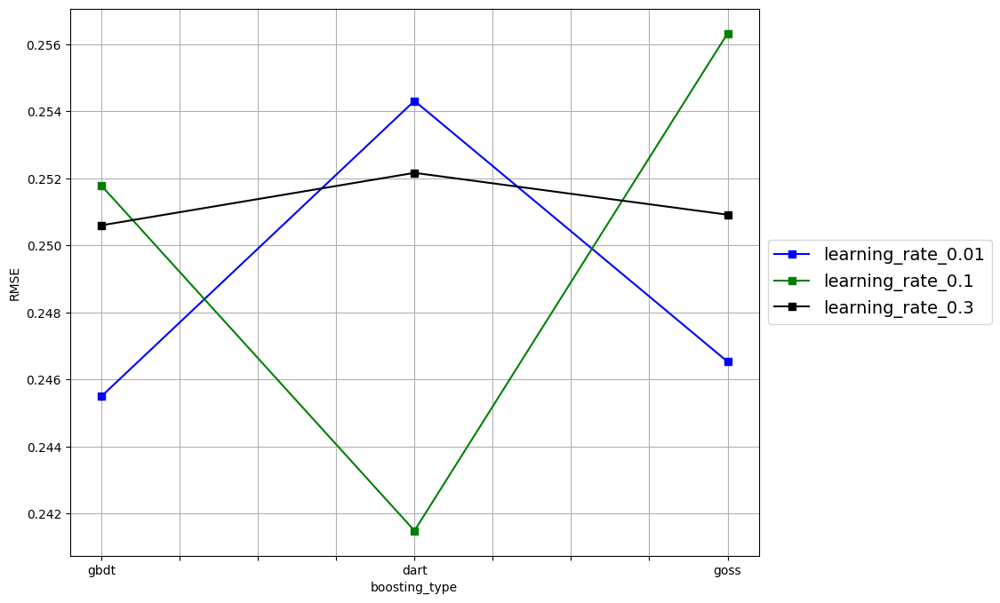

In [71]:
# Plot performance versus params
rcParams['figure.figsize'] = 10, 8 # width 10, height 8
temp = error_rate[error_rate[param2_label]==param2_list[0]]
ax = temp.plot(x=param_label, y='rmse', style='bs-', grid=True)
legend_list = [param2_label + '_' + str(param2_list[0])]

color_list = ['r', 'g', 'k', 'y', 'm', 'c', '0.75']
for i in range(1,len(param2_list)):
    temp = error_rate[error_rate[param2_label]==param2_list[i]]
    ax = temp.plot(x=param_label, y='rmse', color=color_list[i%len(color_list)], marker='s', grid=True, ax=ax)
    legend_list.append(param2_label + '_' + str(param2_list[i]))

ax.set_xlabel(param_label)
ax.set_ylabel("RMSE")
# ax.set_ylim([0, 20])
matplotlib.rcParams.update({'font.size': 14})
plt.legend(legend_list, loc='center left', bbox_to_anchor=(1.0, 0.5))

In [72]:
# Get optimum value for param and param2, using RMSE
temp = error_rate[error_rate['rmse'] == error_rate['rmse'].min()]
boosting_type_opt = temp[param_label].values[0]
learning_rate_opt = temp[param2_label].values[0]
print("min RMSE = %0.3f" % error_rate['rmse'].min())
print("optimum params = ")
boosting_type_opt, learning_rate_opt

min RMSE = 0.241
optimum params = 


('dart', 0.1)

In [73]:
# Get optimum value for param and param2, using MAPE
temp = error_rate[error_rate['mape'] == error_rate['mape'].min()]
print("min MAPE = %0.3f%%" % error_rate['mape'].min())
print("optimum params = ")
temp[param_label].values[0], temp[param2_label].values[0]

min MAPE = 4.050%
optimum params = 


('dart', 0.1)

In [74]:
param_label = 'max_depth'
param_list = [-1, 1, 2, 6]

param2_label = 'n_estimators'
param2_list = [50, 100, 150]

error_rate = defaultdict(list)

tic = time.time()
for param in tqdm_notebook(param_list):
    for param2 in param2_list:
        rmse_mean, mape_mean, mae_mean, _, _, _, _, _ = get_error_metrics_stacking(train_val,
                                                              train_size,
                                                              'daily_ret',
                                                              N_opt,
                                                              tech_indicators,
                                                              H,
                                                              seed=model_seed,
                                                              boosting_type=boosting_type_opt,
                                                              learning_rate=learning_rate_opt,
                                                              max_depth=param,
                                                              n_estimators=param2, 
                                                              n_estimators_etr=n_estimators_etr,
                                                              max_depth_etr=max_depth_etr,
                                                              max_features_etr=max_features_etr,
                                                              min_samples_split_etr=min_samples_split_etr,                     
                                                              kernel=kernel,
                                                              C=C,
                                                              gamma_svr=gamma_svr)

        # Collect results
        error_rate[param_label].append(param)
        error_rate[param2_label].append(param2)
        error_rate['rmse'].append(rmse_mean)
        error_rate['mape'].append(mape_mean)
        error_rate['mae'].append(mae_mean)
    
error_rate = pd.DataFrame(error_rate)
toc = time.time()
print("Minutes taken = {0:.2f}".format((toc-tic)/60.0))

error_rate   

  0%|          | 0/4 [00:00<?, ?it/s]

Minutes taken = 62.30


,max_depth,n_estimators,rmse,mape,mae
0,-1,50,0.243519,4.078236,0.204089
1,-1,100,0.243157,4.068002,0.203216
2,-1,150,0.241877,4.065852,0.203048
3,1,50,0.244510,4.046657,0.202818
4,1,100,0.246027,4.076021,0.204267
5,1,150,0.242935,4.025533,0.201692
6,2,50,0.246834,4.109278,0.205301
7,2,100,0.246501,4.096432,0.204985
8,2,150,0.247325,4.109889,0.206015
9,6,50,0.246483,4.114976,0.206153


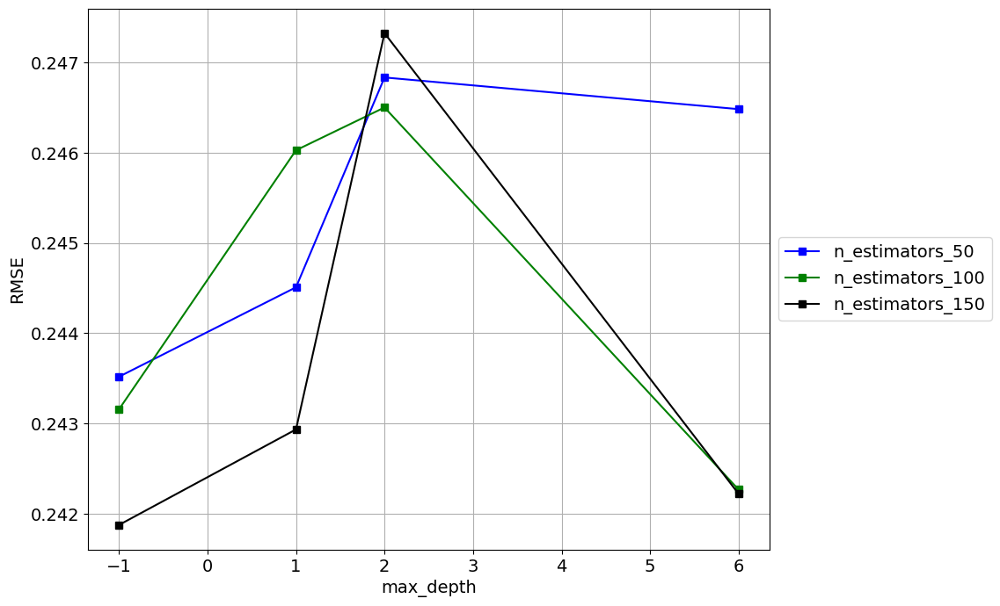

In [75]:
# Plot performance versus params
rcParams['figure.figsize'] = 10, 8 # width 10, height 8
temp = error_rate[error_rate[param2_label]==param2_list[0]]
ax = temp.plot(x=param_label, y='rmse', style='bs-', grid=True)
legend_list = [param2_label + '_' + str(param2_list[0])]

color_list = ['r', 'g', 'k', 'y', 'm', 'c', '0.75']
for i in range(1,len(param2_list)):
    temp = error_rate[error_rate[param2_label]==param2_list[i]]
    ax = temp.plot(x=param_label, y='rmse', color=color_list[i%len(color_list)], marker='s', grid=True, ax=ax)
    legend_list.append(param2_label + '_' + str(param2_list[i]))

ax.set_xlabel(param_label)
ax.set_ylabel("RMSE")
matplotlib.rcParams.update({'font.size': 14})
plt.legend(legend_list, loc='center left', bbox_to_anchor=(1.0, 0.5))

In [76]:
# Get optimum value for param and param2, using RMSE
temp = error_rate[error_rate['rmse'] == error_rate['rmse'].min()]
max_depth_opt = temp[param_label].values[0]
n_estimators_opt = temp[param2_label].values[0]
print("min RMSE = %0.3f" % error_rate['rmse'].min())
print("optimum params = ")
max_depth_opt, n_estimators_opt

min RMSE = 0.242
optimum params = 


(-1, 150)

In [77]:
# Get optimum value for param and param2, using MAPE
temp = error_rate[error_rate['mape'] == error_rate['mape'].min()]
print("min MAPE = %0.3f%%" % error_rate['mape'].min())
print("optimum params = ")
temp[param_label].values[0], temp[param2_label].values[0]

min MAPE = 4.026%
optimum params = 


(1, 150)

In [78]:
param_label = 'n_estimators_etr'
param_list = [50, 100, 150]

param2_label = 'max_depth_etr'
param2_list = [None, 1, 3, 5]

error_rate = defaultdict(list)

tic = time.time()
for param in tqdm_notebook(param_list):
    for param2 in param2_list:
        rmse_mean, mape_mean, mae_mean, _, _, _, _, _ = get_error_metrics_stacking(train_val,
                                                              train_size,
                                                              'daily_ret',
                                                              N_opt,
                                                              tech_indicators,
                                                              H,
                                                              seed=model_seed,
                                                              boosting_type=boosting_type_opt,
                                                              learning_rate=learning_rate_opt,
                                                              max_depth=max_depth_opt,
                                                              n_estimators=n_estimators_opt, 
                                                              n_estimators_etr=param,
                                                              max_depth_etr=param2,
                                                              max_features_etr=max_features_etr,
                                                              min_samples_split_etr=min_samples_split_etr,                     
                                                              kernel=kernel,
                                                              C=C,
                                                              gamma_svr=gamma_svr)

        # Collect results
        error_rate[param_label].append(param)
        error_rate[param2_label].append(param2)
        error_rate['rmse'].append(rmse_mean)
        error_rate['mape'].append(mape_mean)
        error_rate['mae'].append(mae_mean)
    
error_rate = pd.DataFrame(error_rate)
toc = time.time()
print("Minutes taken = {0:.2f}".format((toc-tic)/60.0))

error_rate   

  0%|          | 0/3 [00:00<?, ?it/s]

Minutes taken = 42.73


,n_estimators_etr,max_depth_etr,rmse,mape,mae
0,50,NaN,0.239674,4.022209,0.200773
1,50,1.0,0.243878,4.081942,0.203926
2,50,3.0,0.245146,4.119110,0.205841
3,50,5.0,0.242968,4.092708,0.204380
4,100,NaN,0.241984,4.060041,0.202741
5,100,1.0,0.244360,4.088725,0.204328
6,100,3.0,0.244119,4.101260,0.204929
7,100,5.0,0.242795,4.094958,0.204390
8,150,NaN,0.242659,4.071308,0.203314
9,150,1.0,0.244185,4.086184,0.204182


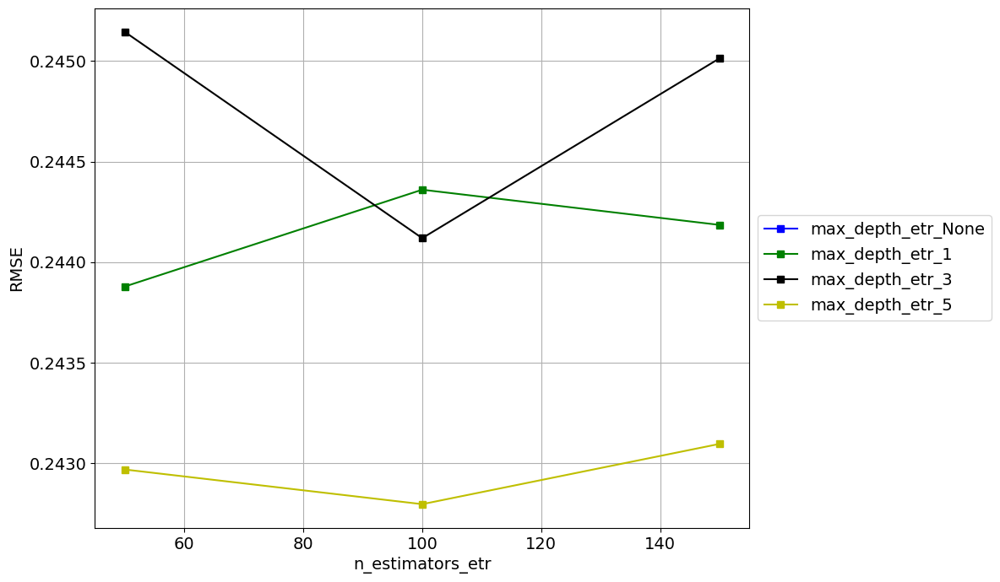

In [79]:
# Plot performance versus params
rcParams['figure.figsize'] = 10, 8 # width 10, height 8
temp = error_rate[error_rate[param2_label]==param2_list[0]]
ax = temp.plot(x=param_label, y='rmse', style='bs-', grid=True)
legend_list = [param2_label + '_' + str(param2_list[0])]

color_list = ['r', 'g', 'k', 'y', 'm', 'c', '0.75']
for i in range(1,len(param2_list)):
    temp = error_rate[error_rate[param2_label]==param2_list[i]]
    ax = temp.plot(x=param_label, y='rmse', color=color_list[i%len(color_list)], marker='s', grid=True, ax=ax)
    legend_list.append(param2_label + '_' + str(param2_list[i]))

ax.set_xlabel(param_label)
ax.set_ylabel("RMSE")
matplotlib.rcParams.update({'font.size': 14})
plt.legend(legend_list, loc='center left', bbox_to_anchor=(1.0, 0.5))

In [80]:
# Get optimum value for param and param2, using RMSE
temp = error_rate[error_rate['rmse'] == error_rate['rmse'].min()]
n_estimators_etr_opt = temp[param_label].values[0]
max_depth_etr_opt = temp[param2_label].values[0]
print("min RMSE = %0.3f" % error_rate['rmse'].min())
print("optimum params = ")
n_estimators_etr_opt, max_depth_etr_opt

min RMSE = 0.240
optimum params = 


(50, nan)

In [81]:
# Get optimum value for param and param2, using MAPE
temp = error_rate[error_rate['mape'] == error_rate['mape'].min()]
print("min MAPE = %0.3f%%" % error_rate['mape'].min())
print("optimum params = ")
temp[param_label].values[0], temp[param2_label].values[0]

min MAPE = 4.022%
optimum params = 


(50, nan)

In [82]:
if np.isnan(max_depth_etr_opt):
    max_depth_etr_opt = None

In [ ]:
param_label = 'max_features_etr'
param_list = ['auto', 'sqrt', 'log2']

param2_label = 'min_samples_split_etr'
param2_list = [2, 6, 10]

error_rate = defaultdict(list)

tic = time.time()
for param in tqdm_notebook(param_list):
    for param2 in param2_list:
        rmse_mean, mape_mean, mae_mean, _, _, _, _, _ = get_error_metrics_stacking(train_val,
                                                              train_size,
                                                              'daily_ret',
                                                              N_opt,
                                                              tech_indicators,
                                                              H,
                                                              seed=model_seed,
                                                              boosting_type=boosting_type_opt,
                                                              learning_rate=learning_rate_opt,
                                                              max_depth=max_depth_opt,
                                                              n_estimators=n_estimators_opt, 
                                                              n_estimators_etr=n_estimators_etr_opt,
                                                              max_depth_etr=max_depth_etr_opt,
                                                              max_features_etr=param,
                                                              min_samples_split_etr=param2,                     
                                                              kernel=kernel,
                                                              C=C,
                                                              gamma_svr=gamma_svr)

        # Collect results
        error_rate[param_label].append(param)
        error_rate[param2_label].append(param2)
        error_rate['rmse'].append(rmse_mean)
        error_rate['mape'].append(mape_mean)
        error_rate['mae'].append(mae_mean)
    
error_rate = pd.DataFrame(error_rate)
toc = time.time()
print("Minutes taken = {0:.2f}".format((toc-tic)/60.0))

error_rate   

In [ ]:
# Plot performance versus params
rcParams['figure.figsize'] = 10, 8 # width 10, height 8
temp = error_rate[error_rate[param2_label]==param2_list[0]]
ax = temp.plot(x=param_label, y='rmse', style='bs-', grid=True)
legend_list = [param2_label + '_' + str(param2_list[0])]

color_list = ['r', 'g', 'k', 'y', 'm', 'c', '0.75']
for i in range(1,len(param2_list)):
    temp = error_rate[error_rate[param2_label]==param2_list[i]]
    ax = temp.plot(x=param_label, y='rmse', color=color_list[i%len(color_list)], marker='s', grid=True, ax=ax)
    legend_list.append(param2_label + '_' + str(param2_list[i]))

ax.set_xlabel(param_label)
ax.set_ylabel("RMSE")
matplotlib.rcParams.update({'font.size': 14})
plt.legend(legend_list, loc='center left', bbox_to_anchor=(1.0, 0.5))

In [ ]:

# Get optimum value for param and param2, using RMSE
temp = error_rate[error_rate['rmse'] == error_rate['rmse'].min()]
max_features_etr_opt = temp[param_label].values[0]
min_samples_split_etr_opt = temp[param2_label].values[0]
print("min RMSE = %0.3f" % error_rate['rmse'].min())
print("optimum params = ")
max_features_etr_opt, min_samples_split_etr_opt

In [ ]:
# Get optimum value for param and param2, using MAPE
temp = error_rate[error_rate['mape'] == error_rate['mape'].min()]
print("min MAPE = %0.3f%%" % error_rate['mape'].min())
print("optimum params = ")
temp[param_label].values[0], temp[param2_label].values[0]

In [ ]:
param_label = 'C'
param_list = [0.1, 1, 10]

param2_label = 'gamma_svr'
param2_list = [1, 0.1, 0.01]

param3_label = 'kernel'
param3_list = ['rbf', 'sigmoid']

error_rate = defaultdict(list)

tic = time.time()
for param in tqdm_notebook(param_list):    
    for param2 in param2_list:
        for param3 in param3_list:
            rmse_mean, mape_mean, mae_mean, _, _, _, _, _ = get_error_metrics_stacking(train_val,
                                                              train_size,
                                                              'daily_ret',
                                                              N_opt,
                                                              tech_indicators,
                                                              H,
                                                              seed=model_seed,
                                                              boosting_type=boosting_type_opt,
                                                              learning_rate=learning_rate_opt,
                                                              max_depth=max_depth_opt,
                                                              n_estimators=n_estimators_opt,
                                                              n_estimators_etr=n_estimators_etr_opt,
                                                              max_depth_etr=max_depth_etr_opt,
                                                              max_features_etr=max_features_etr_opt,
                                                              min_samples_split_etr=min_samples_split_etr_opt,                         
                                                              kernel=param3,
                                                              C=param,
                                                              gamma_svr=param2)

    
            # Collect results
            error_rate[param_label].append(param)
            error_rate[param2_label].append(param2)
            error_rate[param3_label].append(param3)
            error_rate['rmse'].append(rmse_mean)
            error_rate['mape'].append(mape_mean)
            error_rate['mae'].append(mae_mean)
    
error_rate = pd.DataFrame(error_rate)
toc = time.time()
print("Minutes taken = {0:.2f}".format((toc-tic)/60.0))

error_rate   

In [ ]:
# Plot performance versus params
rcParams['figure.figsize'] = 10, 8 # width 10, height 8
temp = error_rate[error_rate[param2_label]==param2_list[0]]
ax = temp.plot(x=param_label, y='rmse', style='bs-', grid=True)
legend_list = [param2_label + '_' + str(param2_list[0])]

color_list = ['r', 'g', 'k', 'y', 'm', 'c', '0.75']
for i in range(1,len(param2_list)):
    temp = error_rate[error_rate[param2_label]==param2_list[i]]
    ax = temp.plot(x=param_label, y='rmse', color=color_list[i%len(color_list)], marker='s', grid=True, ax=ax)
    legend_list.append(param2_label + '_' + str(param2_list[i]))

ax.set_xlabel(param_label)
ax.set_ylabel("RMSE")
matplotlib.rcParams.update({'font.size': 14})
plt.legend(legend_list, loc='center left', bbox_to_anchor=(1.0, 0.5))

In [ ]:
# Get optimum value for param and param2, using RMSE
temp = error_rate[error_rate['rmse'] == error_rate['rmse'].min()]
C_opt = temp[param_label].values[0]
gamma_svr_opt = temp[param2_label].values[0]
kernel_opt = temp[param3_label].values[0]
print("min RMSE = %0.3f" % error_rate['rmse'].min())
print("optimum params = ")
C_opt, gamma_svr_opt, kernel_opt

In [ ]:
# Get optimum value for param and param2, using MAPE
temp = error_rate[error_rate['mape'] == error_rate['mape'].min()]
print("min MAPE = %0.3f%%" % error_rate['mape'].min())
print("optimum params = ")
temp[param_label].values[0], temp[param2_label].values[0], temp[param3_label].values[0]

In [ ]:
# Get error metrics on validation set after hyperparameter tuning
rmse_aft_tuning, mape_aft_tuning, mae_aft_tuning, preds_dict, _, _, model_level2, scaler_level2 = \
                                                      get_error_metrics_stacking(train_val,
                                                                        train_size,
                                                                        'daily_ret',
                                                                        N_opt,
                                                                        tech_indicators,
                                                                        H,
                                                                        seed=model_seed,
                                                                        boosting_type=boosting_type_opt,
                                                                        learning_rate=learning_rate_opt,
                                                                        max_depth=max_depth_opt,
                                                                        n_estimators=n_estimators_opt,
                                                                        n_estimators_etr=n_estimators_etr,
                                                                        max_depth_etr=max_depth_etr,
                                                                        max_features_etr=max_features_etr,
                                                                        min_samples_split_etr=min_samples_split_etr,
                                                                        kernel=kernel_opt,
                                                                        C=C_opt,
                                                                        gamma_svr=gamma_svr_opt)
print("RMSE = %0.3f" % rmse_aft_tuning)
print("MAPE = %0.3f%%" % mape_aft_tuning)
print("MAE = %0.3f" % mae_aft_tuning)

In [ ]:
# Plot validation predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=train['date'], 
                         y=train['adj_close'],
                         mode='lines',
                         name='train',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=val['date'], 
                         y=val['adj_close'],
                         mode='lines',
                         name='validation',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=test['date'], 
                         y=test['adj_close'],
                         mode='lines',
                         name='test',
                         line=dict(color='green')))

# Plot the predictions
n = 0
for key in preds_dict:
    fig.add_trace(go.Scatter(x=train_val[key:key+H]['date'], 
                             y=preds_dict[key],
                             mode='lines',
                             name='predictions',
                             line=dict(color=colors[n%len(colors)])))
    n = n + 1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))
fig.update_xaxes(range=[val['date'].min(), val['date'].max()])
fig.update_yaxes(range=[val['adj_close'].min(), val['adj_close'].max()])
py.iplot(fig, filename='StockReturnsPrediction_v8_xgboost_val_aft_tune')

In [ ]:
# Do prediction on test set
test_rmse_aft_tuning, test_mape_aft_tuning, test_mae_aft_tuning, preds_dict = \
                                            get_error_metrics_stacking_onepred(df[pred_day-train_val_size:pred_day+H],
                                                                       train_size+val_size,
                                                                       'daily_ret',
                                                                       N_opt,
                                                                       tech_indicators,
                                                                       H,
                                                                       model_level2,
                                                                       scaler_level2,
                                                                       seed=model_seed,
                                                                       boosting_type=boosting_type_opt,
                                                                       learning_rate=learning_rate_opt,
                                                                       max_depth=max_depth_opt,
                                                                       n_estimators=n_estimators_opt,
                                                                       n_estimators_etr=n_estimators_etr,
                                                                       max_depth_etr=max_depth_etr,
                                                                       max_features_etr=max_features_etr,
                                                                       min_samples_split_etr=min_samples_split_etr,
                                                                       kernel=kernel_opt,
                                                                       C=C_opt,
                                                                       gamma_svr=gamma_svr_opt)


print("RMSE = %0.3f" % test_rmse_aft_tuning)
print("MAPE = %0.3f%%" % test_mape_aft_tuning)
print("MAE = %0.3f" % test_mae_aft_tuning)

In [ ]:
# Plot test predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=train['date'], 
                         y=train['adj_close'],
                         mode='lines',
                         name='train',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=val['date'], 
                         y=val['adj_close'],
                         mode='lines',
                         name='validation',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=test['date'], 
                         y=test['adj_close'],
                         mode='lines',
                         name='test',
                         line=dict(color='green')))
fig.add_trace(go.Scatter(x=test[:H]['date'], 
                         y=preds_dict[list(preds_dict.keys())[0]],
                         mode='lines',
                         name='predictions',
                         line=dict(color='red')))
fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))

In [ ]:
# View a list of the features and their importance scores
imp = list(zip(features, feature_importances))
imp.sort(key=lambda tup: tup[1], reverse=False) 
imp

In [ ]:
# Plot the importance scores as a bar chart
fig = go.Figure(go.Bar(
            x=[item[1] for item in imp[-10:]],
            y=[item[0] for item in imp[-10:]],
            orientation='h'))
fig.show()

In [ ]:
boosting_type=boosting_type_opt, 
                                                                       learning_rate=learning_rate_opt, 
                                                                       max_depth=max_depth_opt, 
                                                                       n_estimators=n_estimators_opt,
                                                                       n_estimators_etr=n_estimators_etr,
                                                                       max_depth_etr=max_depth_etr,
                                                                       max_features_etr=max_features_etr,
                                                                       min_samples_split_etr=min_samples_split_etr,
                                                                       kernel=kernel_opt,
                                                                       C=C_opt,
                                                                       gamma_svr=gamma_svr_opt

In [ ]:
# Tuned params and before and after error metrics
d = {'param': ['boosting_type', 
               'learning_rate', 
               'max_depth', 
               'n_estimators', 
               'n_estimators_etr', 
               'max_depth_etr',
               'max_features_etr',
               'min_samples_split_etr',
               'kernel', 
               'C', 
               'gamma_svr', 
               'val_rmse', 
               'val_mape', 
               'val_mae'],
     'before_tuning': [boosting_type, 
                       learning_rate, 
                       max_depth, 
                       n_estimators, 
                       n_estimators_etr, 
                       max_depth_etr,
                       max_features_etr,
                       min_samples_split_etr,
                       kernel, 
                       C, 
                       gamma_svr, 
                       rmse_bef_tuning, 
                       mape_bef_tuning, 
                       mae_bef_tuning],
     'after_tuning': [boosting_type_opt, 
                      learning_rate_opt, 
                      max_depth_opt, 
                      n_estimators_opt, 
                      n_estimators_etr_opt, 
                      max_depth_etr_opt,
                      max_features_etr_opt,
                      min_samples_split_etr_opt,
                      kernel_opt, 
                      C_opt, 
                      gamma_svr_opt, 
                      rmse_aft_tuning, 
                      mape_aft_tuning, 
                      mae_aft_tuning]}
tuned_params = pd.DataFrame(d)
tuned_params = tuned_params.round(3)
tuned_params

In [ ]:

# Put tuned_params into pickle
pickle.dump(tuned_params, open("./out/v8_tuned_params_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))

In [ ]:
toc1 = time.time()
print("Total minutes taken = {0:.2f}".format((toc1-tic1)/60.0))

In [ ]:
print("Predicting on day %d, date %s, with forecast horizon H = %d" % (pred_day, df.iloc[pred_day]['date'].strftime("%Y-%m-%d"), H))

In [ ]:
rmse_bef_tuning, rmse_aft_tuning

In [ ]:
test_rmse_bef_tuning, test_rmse_aft_tuning

In [ ]:
# Put results into pickle
pickle.dump(rmse_bef_tuning, open("./out/v8_val_rmse_bef_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(rmse_aft_tuning, open("./out/v8_val_rmse_aft_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_rmse_bef_tuning, open("./out/v8_test_rmse_bef_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_mape_bef_tuning, open("./out/v8_test_mape_bef_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_mae_bef_tuning, open("./out/v8_test_mae_bef_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_rmse_aft_tuning, open("./out/v8_test_rmse_aft_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_mape_aft_tuning, open("./out/v8_test_mape_aft_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_mae_aft_tuning, open("./out/v8_test_mae_aft_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(preds_dict[list(preds_dict.keys())[0]], open("./out/v8_test_est_aft_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))


In [ ]:
# Consolidate results
# H = 21                         # Forecast horizon, in days. Note there are about 252 trading days in a year
# train_size = 252*3             # Use 3 years of data as train set. Note there are about 252 trading days in a year
# val_size = 252                 # Use 1 year of data as validation set
# N = 10                          # for feature at day t, we use lags from t-1, t-2, ..., t-N as features
results = defaultdict(list)
ests = {} # the predictions
date_list = ['2017-01-03',
             '2017-03-06',
             '2017-05-04',
             '2017-07-05',
             '2017-09-01',
             '2017-11-01',
             '2018-01-03',
             '2018-03-06',
             '2018-05-04',
             '2018-07-05',
             '2018-09-04',
             '2018-11-01'
            ]
for date in date_list:
    if os.path.exists("./out/v8_val_rmse_bef_tuning_" + date + ".pickle"):
        results['date'].append(date)
        results['val_rmse_bef_tuning'].append(pickle.load(open( "./out/v8_val_rmse_bef_tuning_" + date + ".pickle", "rb")))
        results['val_rmse_aft_tuning'].append(pickle.load(open( "./out/v8_val_rmse_aft_tuning_" + date + ".pickle", "rb")))
        results['test_rmse_bef_tuning'].append(pickle.load(open( "./out/v8_test_rmse_bef_tuning_" + date + ".pickle", "rb")))
        results['test_rmse_aft_tuning'].append(pickle.load(open( "./out/v8_test_rmse_aft_tuning_" + date + ".pickle", "rb")))
        results['test_mape_bef_tuning'].append(pickle.load(open( "./out/v8_test_mape_bef_tuning_" + date + ".pickle", "rb")))
        results['test_mape_aft_tuning'].append(pickle.load(open( "./out/v8_test_mape_aft_tuning_" + date + ".pickle", "rb")))
        results['test_mae_bef_tuning'].append(pickle.load(open( "./out/v8_test_mae_bef_tuning_" + date + ".pickle", "rb")))
        results['test_mae_aft_tuning'].append(pickle.load(open( "./out/v8_test_mae_aft_tuning_" + date + ".pickle", "rb")))
        ests[date] = pickle.load(open( "./out/v8_test_est_aft_tuning_" + date + ".pickle", "rb"))
    
results = pd.DataFrame(results)
results


In [ ]:
# Generate a condensed dataframe of the above
results_short = defaultdict(list)
hyperparam_list = ['boosting_type', 
                   'learning_rate', 
                   'max_depth', 
                   'n_estimators',
                   'kernel',
                   'C',
                   'gamma_svr'
                  ]

for date in date_list:
    if os.path.exists("./out/v8_val_rmse_bef_tuning_" + date + ".pickle"):
        results_short['date'].append(date)
        results_short['RMSE'].append(pickle.load(open( "./out/v8_test_rmse_aft_tuning_" + date + ".pickle", "rb")))
        results_short['MAPE(%)'].append(pickle.load(open( "./out/v8_test_mape_aft_tuning_" + date + ".pickle", "rb")))
        results_short['MAE'].append(pickle.load(open( "./out/v8_test_mae_aft_tuning_" + date + ".pickle", "rb")))
    
        tuned_params = pickle.load(open("./out/v8_tuned_params_" + date + ".pickle", "rb"))
        for hyperparam in hyperparam_list:
            results_short[hyperparam].append(tuned_params[tuned_params['param']==hyperparam]['after_tuning'].values[0])

    
results_short = pd.DataFrame(results_short)
results_short

In [ ]:
results.mean()

In [ ]:
# Plot all predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'],
                         mode='lines',
                         name='adj_close',
                         line=dict(color='blue')))

# Plot the predictions
n = 0
for key in ests:
    i = df[df['date']==key].index[0]
    fig.add_trace(go.Scatter(x=df[i:i+H]['date'], 
                             y=ests[key],
                             mode='lines',
                             name='predictions',
                             line=dict(color=colors[n%len(colors)])))
    n = n + 1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))
fig.update_xaxes(range=['2017-01-03', '2018-12-28'])
fig.update_yaxes(range=[110, 150])
py.iplot(fig, filename='StockPricePrediction_v8_xgboost_predictions')

In [ ]:
# Plot scatter plot of actual values vs. predictions
fig = go.Figure()

n = 0
for key in ests:
    i = df[df['date']==key].index[0]
    fig.add_trace(go.Scatter(x=df[i:i+H]['adj_close'], 
                             y=ests[key],
                             mode='markers',
                             name='predictions',
                             line=dict(color=colors[n%len(colors)])))
    n = n + 1

fig.add_trace(go.Scatter(x=list(range(110, 155, 1)),
                         y=list(range(110, 155, 1)),
                         mode='lines',
                         name='actual values',
                         line=dict(color='blue')))

fig.update_layout(yaxis=dict(title='forecasts'),
                  xaxis=dict(title='adj_close'))

In [ ]:
# Compare results with benchmark
all_results = pd.DataFrame({'Method': ['Last value',  
                                       'XGBoost w/o date features', 
                                       'XGBoost w date features', 
                                       'XGBoost w/o date features, w technical indicators',
                                       'XGBoost w/o date features, w technical indicators and direct forecasting',
                                       'XGBoost w/o date features, w technical indicators, direct forecasting and stacking(XGBoost, LR, SVR -> LR)',
                                       'XGBoost w/o date features, w technical indicators, direct forecasting and stacking(LightGBM, LR, SVR -> LR)',
                                       'XGBoost w/o date features, w technical indicators, direct forecasting and stacking(LightGBM, ExtraTrees, SVR -> LR)'],
                            'RMSE': [2.53, 2.33, 2.37, 2.38, 2.04, 2.26, 2.39, 2.07],
                            'MAPE(%)': [1.69, 1.55, 1.61, 1.59, 1.34, 1.48, 1.58, 1.36],
                            'MAE': [2.26, 2.08, 2.11, 2.12, 1.81, 1.97, 2.09, 1.81]})

with pd.option_context('max_colwidth', -1): # make sure the whole string in Method is printed out
    display(all_results)